In [1]:
import numpy as np
from PIL import Image
import pandas as pd
import seam_carving
import cv2
from skimage import io, transform, color
import pandas as pd


# Read the CSV file from specifix path in external CD
breast_level_annotations = pd.read_csv('E:/PhD/V_M_Dataset/breast-level_annotations.csv')
# Read the CSV file
finding_annotations = pd.read_csv('E:/PhD/V_M_Dataset/finding_annotations.csv')
metadata = pd.read_csv('E:/PhD/V_M_Dataset/metadata.csv')
#for our interes we create the new DB with important columns in owr interes.
selected_columns_BLA = breast_level_annotations[[ 'study_id' , 'series_id', 'image_id', 'breast_birads', 'split','laterality' , 'view_position', 'breast_density']]


selected_columns_BLA.head()

,study_id,series_id,image_id,breast_birads,split,laterality,view_position,breast_density
0,b8d273e8601f348d3664778dae0e7e0b,b36517b9cbbcfd286a7ae04f643af97a,d8125545210c08e1b1793a5af6458ee2,BI-RADS 2,training,L,CC,DENSITY C
1,b8d273e8601f348d3664778dae0e7e0b,b36517b9cbbcfd286a7ae04f643af97a,290c658f4e75a3f83ec78a847414297c,BI-RADS 2,training,L,MLO,DENSITY C
2,b8d273e8601f348d3664778dae0e7e0b,b36517b9cbbcfd286a7ae04f643af97a,cd0fc7bc53ac632a11643ac4cc91002a,BI-RADS 2,training,R,CC,DENSITY C
3,b8d273e8601f348d3664778dae0e7e0b,b36517b9cbbcfd286a7ae04f643af97a,71638b1e853799f227492bfb08a01491,BI-RADS 2,training,R,MLO,DENSITY C
4,8269f5971eaca3e5d3772d1796e6bd7a,d931832a0815df082c085b6e09d20aac,dd9ce3288c0773e006a294188aadba8e,BI-RADS 1,training,L,CC,DENSITY C


In [2]:

def crop_to_roi(original_image, return_mask=False):
    """
    Bën crop një imazh mammografik bazuar në zonën ROI më të madhe (pikselat >0).

    Parametrat:
        original_image (ndarray): Imazhi grayscale (jo RGB).
        return_mask (bool): Nëse është True, kthen edhe maskën e crop-uar.

    Kthen:
        cropped_image (ndarray): Imazhi i crop-uar.
        cropped_mask (ndarray, opsionale): Maskë e crop-uar nëse return_mask=True.
    """
    # Krijo maskën binare nga imazhi
    _, binary_mask = cv2.threshold(original_image, 1, 255, cv2.THRESH_BINARY)

    # Sigurohu që maska është binare
    mask = (binary_mask > 0).astype(np.uint8)

    # Identifiko komponentët e lidhur
    num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(mask, connectivity=8)

    if num_labels <= 1:
        # Vetëm background = 0
        raise ValueError("Maska nuk ka zona aktive (ROI).")

    # Gjej komponentin me sipërfaqen më të madhe (përveç background)
    largest_idx = 1 + np.argmax(stats[1:, cv2.CC_STAT_AREA])

    x, y, w, h, area = stats[largest_idx]

    # Crop imazhin origjinal
    cropped_image = original_image[y:y+h, x:x+w]

    if return_mask:
        cropped_mask = binary_mask[y:y+h, x:x+w]
        return cropped_image, cropped_mask

    return cropped_image


In [3]:
# =====================================================
def focal_loss(gamma=2., alpha=0.25):
    def focal_loss_fixed(y_true, y_pred):
        y_pred = tf.clip_by_value(y_pred, 1e-7, 1. - 1e-7)
        loss = -y_true * alpha * tf.math.pow(1 - y_pred, gamma) * tf.math.log(y_pred) \
               - (1 - y_true) * (1 - alpha) * tf.math.pow(y_pred, gamma) * tf.math.log(1 - y_pred)
        return tf.reduce_mean(loss)
    return focal_loss_fixed

# =====================================================
def dice_coef(y_true, y_pred, smooth=1):
    y_true_f = tf.keras.backend.flatten(y_true)
    y_pred_f = tf.keras.backend.flatten(y_pred)
    intersection = tf.reduce_sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (tf.reduce_sum(y_true_f) + tf.reduce_sum(y_pred_f) + smooth)

def iou_coef(y_true, y_pred, smooth=1):
    y_true_f = tf.keras.backend.flatten(y_true)
    y_pred_f = tf.keras.backend.flatten(y_pred)
    intersection = tf.reduce_sum(y_true_f * y_pred_f)
    union = tf.reduce_sum(y_true_f) + tf.reduce_sum(y_pred_f) - intersection
    return (intersection + smooth) / (union + smooth)


In [4]:
from tensorflow.keras.models import load_model

# Ngarkojmë modelin më të mirë të ruajtur
custom_objects = {"focal_loss_fixed": focal_loss(), "dice_coef": dice_coef, "iou_coef": iou_coef}
error_in_mammo = load_model("error_in_mammo_segmentation.h5", custom_objects=custom_objects)


In [5]:
def elemination_of_errors_in_mammo(image):
    """
    Remove pectoral muscle from a high-resolution mammogram image.

    Parameters:
        image (ndarray): Input grayscale image (high resolution).

    Returns:
        result (ndarray): Image with unwanted structres eleminations(removed).
    """

    # --- Save original shape ---
    original_shape = image.shape[:2]


    # --- Resize to model input size (256x256x1) ---
    resized = cv2.resize(image, (256, 256))
    resized_input = resized.astype(np.float32) / 255.0
    resized_input = np.expand_dims(resized_input, axis=(0, -1))  # (1,256,256,1)

    # --- Predict mask ---
    pred_mask = error_in_mammo.predict(resized_input)[0, :, :, 0]
    mask = (pred_mask > 0.5).astype(np.uint8) * 255  # binary mask



    # --- Resized mask back to original shape ---
    mask_full = cv2.resize(mask, (original_shape[1], original_shape[0]), interpolation=cv2.INTER_NEAREST)

    # --- Apply mask (remove unwanted area) ---
    image[mask_full > 0] = 0


    return image


In [6]:
def delete_text_writen_in_image(image, window_size=(500, 500)):
    # Sigurohu që imazhi është grayscale
    if len(image.shape) == 3:
        gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    else:
        gray_image = image.copy()

    h, w = gray_image.shape

    # Dritaret
    top_left = gray_image[:window_size[0], :window_size[1]]
    top_right = gray_image[:window_size[0], w-window_size[1]:]

    # Gjej vlerat maksimale në secilën dritare
    max_left = np.max(top_left)
    max_right = np.max(top_right)

    if max_left > 0:  
        gray_image[:window_size[0], :window_size[1]][top_left == max_left] = 0
    if max_right > 0:
        gray_image[:window_size[0], w-window_size[1]:][top_right == max_right] = 0

    return gray_image

1/1 [==============================] - 0s 49ms/step


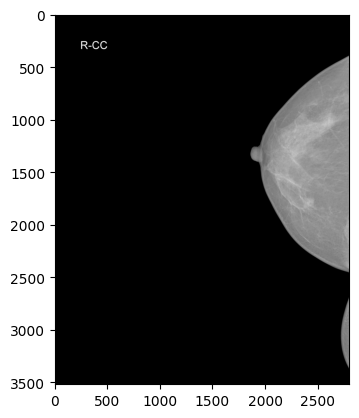

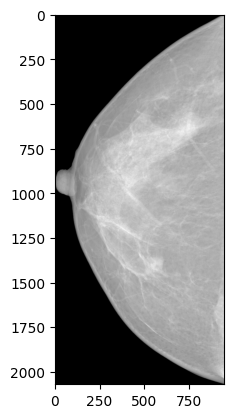

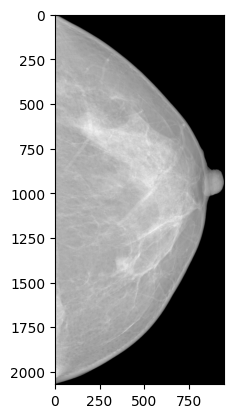

1/1 [==============================] - 0s 34ms/step


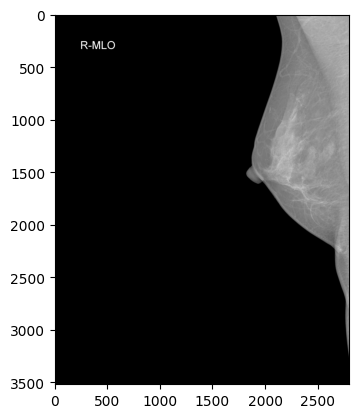

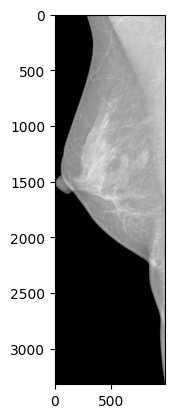

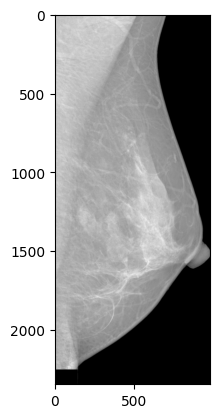

1/1 [==============================] - 0s 40ms/step


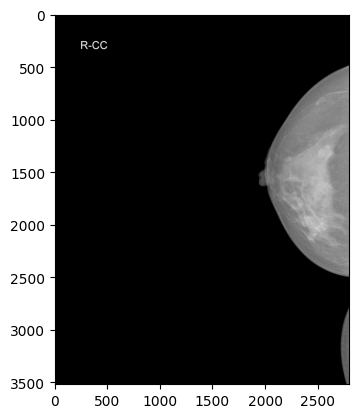

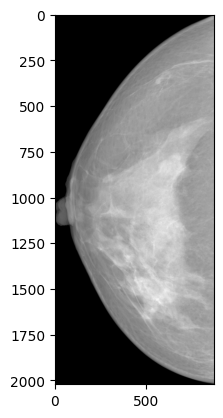

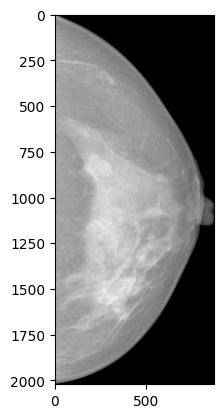

1/1 [==============================] - 0s 37ms/step


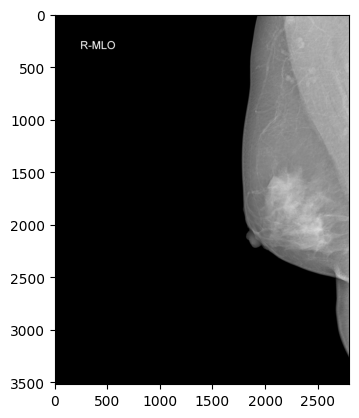

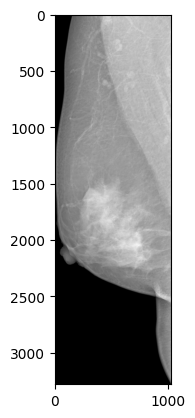

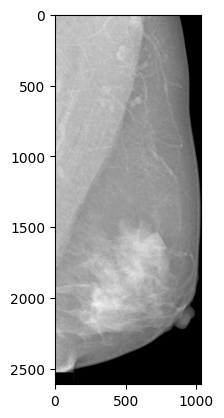

1/1 [==============================] - 0s 43ms/step


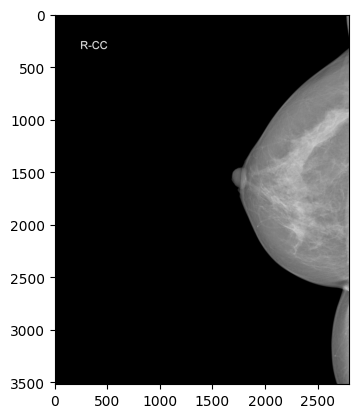

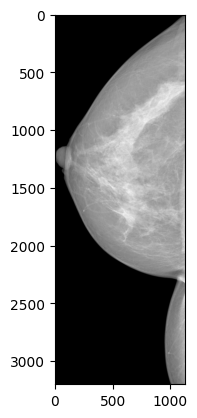

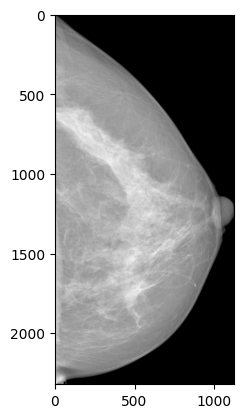

1/1 [==============================] - 0s 41ms/step


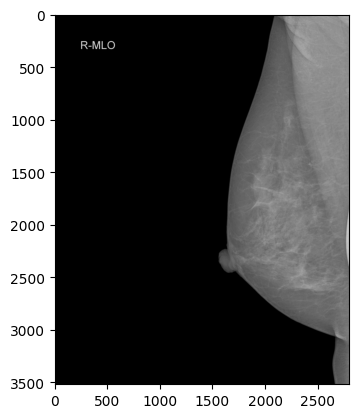

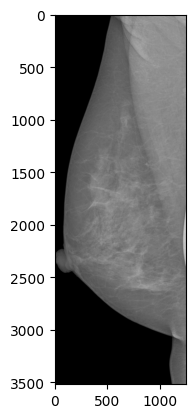

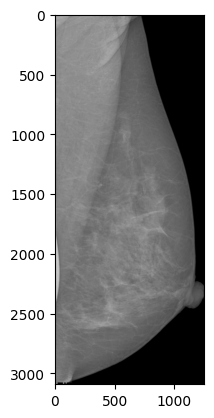

1/1 [==============================] - 0s 38ms/step


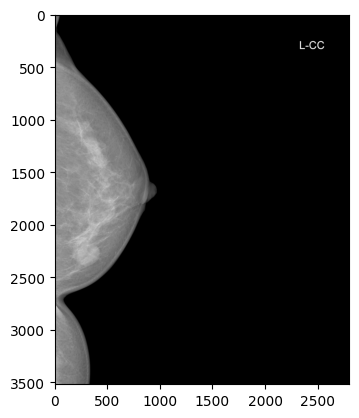

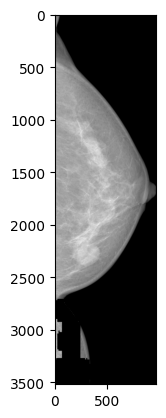

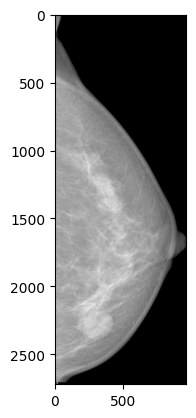

1/1 [==============================] - 0s 44ms/step


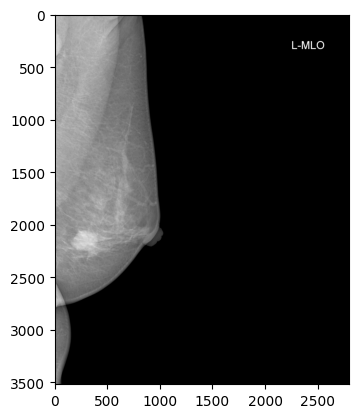

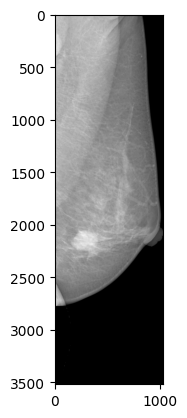

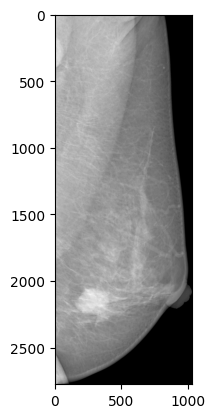

1/1 [==============================] - 0s 46ms/step


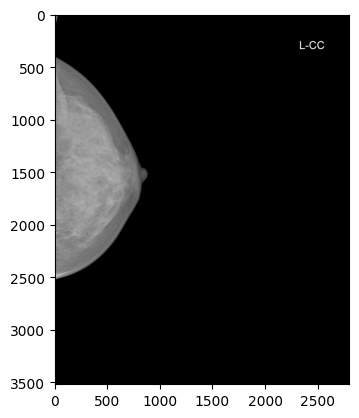

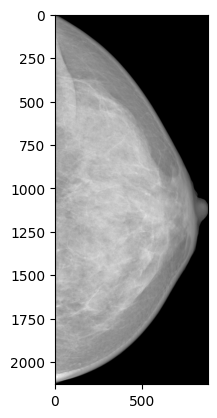

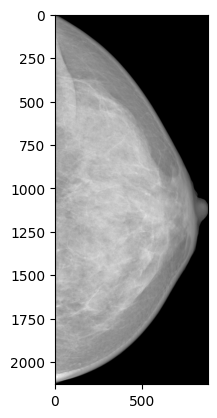

1/1 [==============================] - 0s 37ms/step


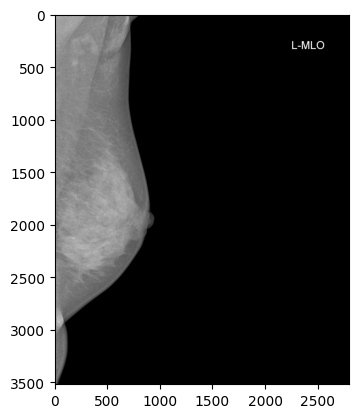

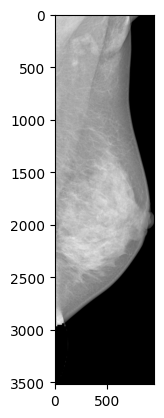

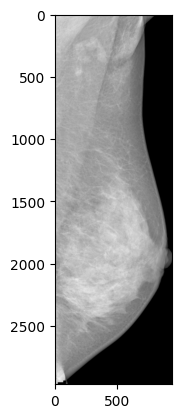

1/1 [==============================] - 0s 44ms/step


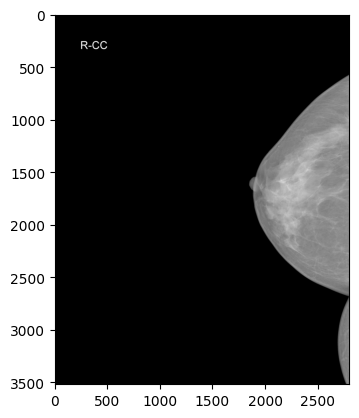

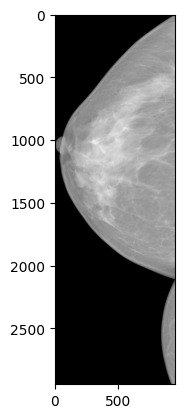

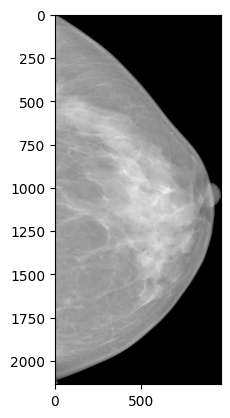

1/1 [==============================] - 0s 48ms/step


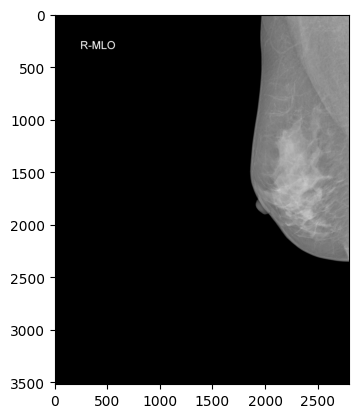

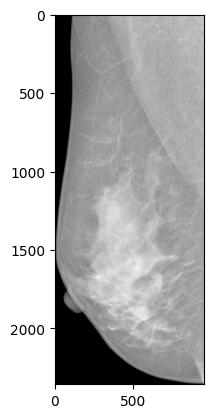

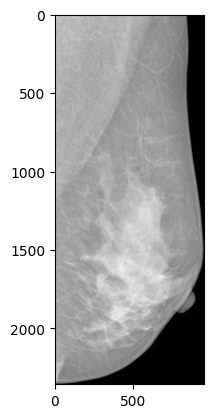

1/1 [==============================] - 0s 43ms/step


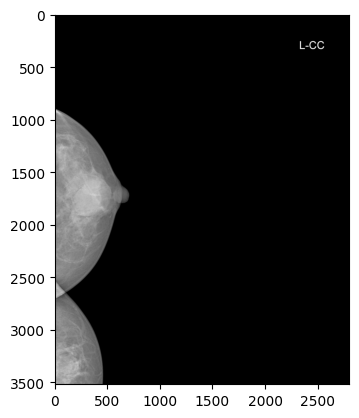

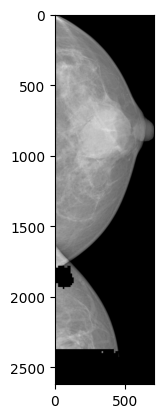

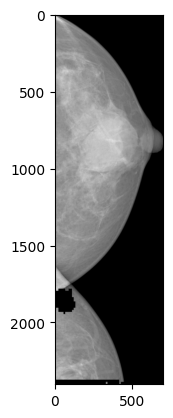

1/1 [==============================] - 0s 31ms/step


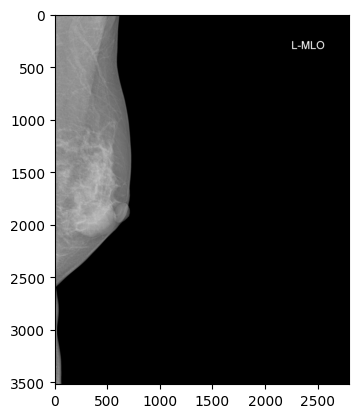

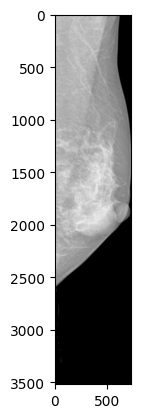

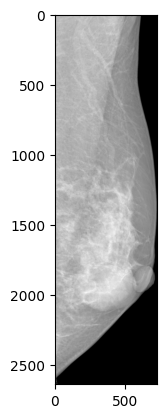

1/1 [==============================] - 0s 34ms/step


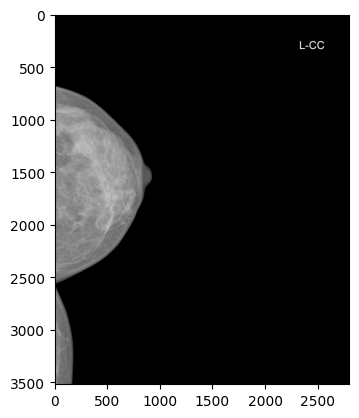

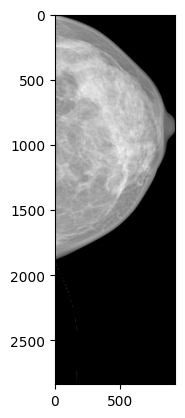

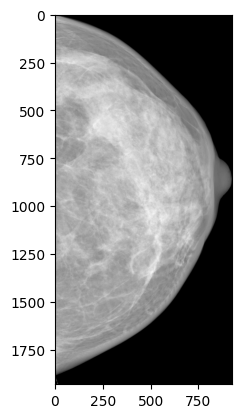

1/1 [==============================] - 0s 44ms/step


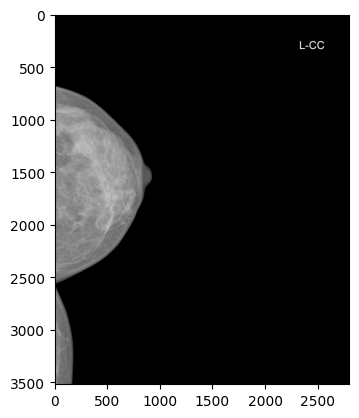

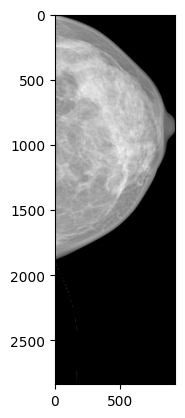

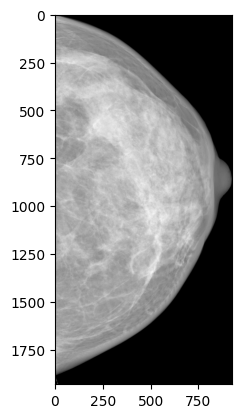

1/1 [==============================] - 0s 42ms/step


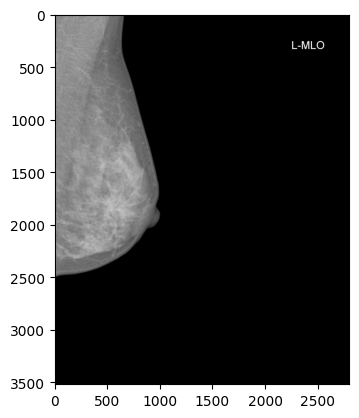

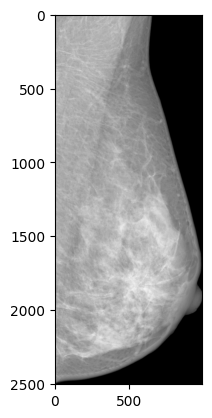

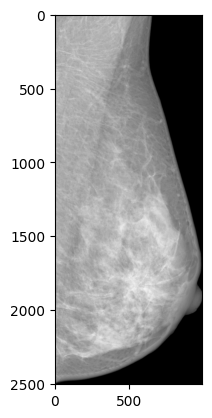

1/1 [==============================] - 0s 46ms/step


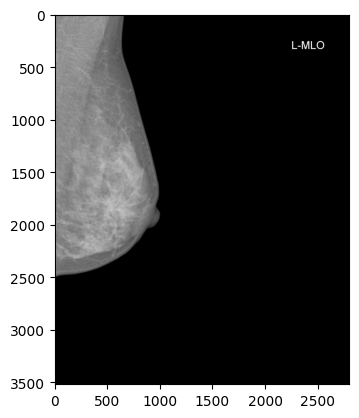

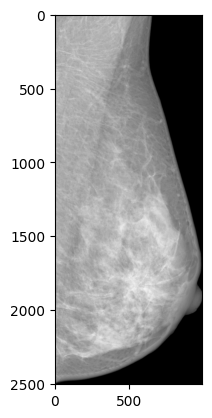

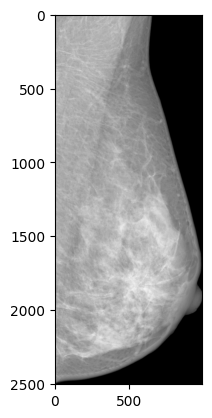

1/1 [==============================] - 0s 39ms/step


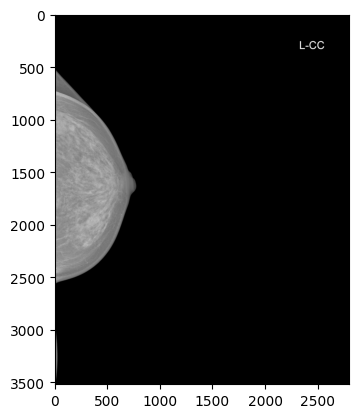

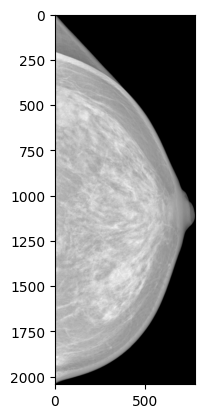

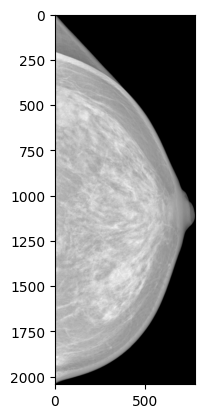

1/1 [==============================] - 0s 32ms/step


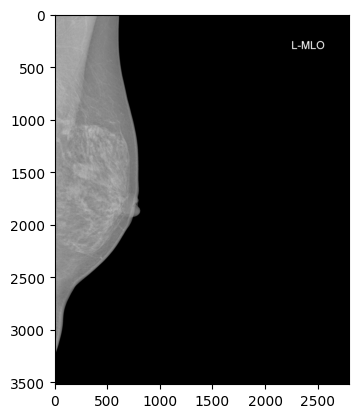

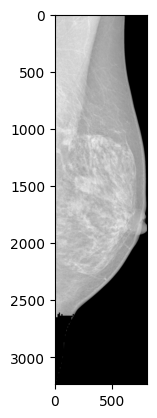

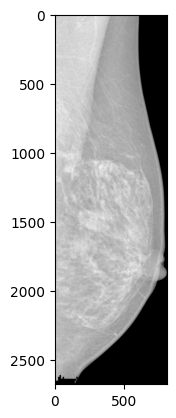

1/1 [==============================] - 0s 28ms/step


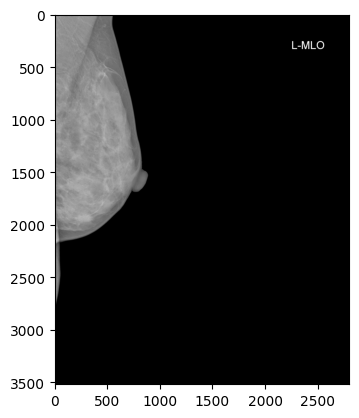

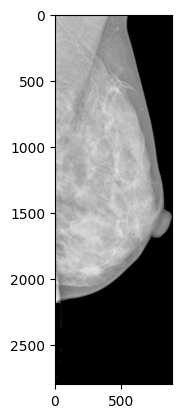

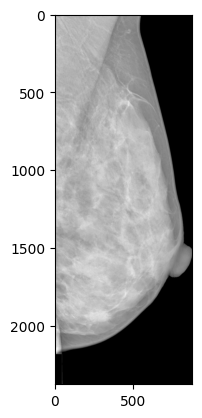

1/1 [==============================] - 0s 42ms/step


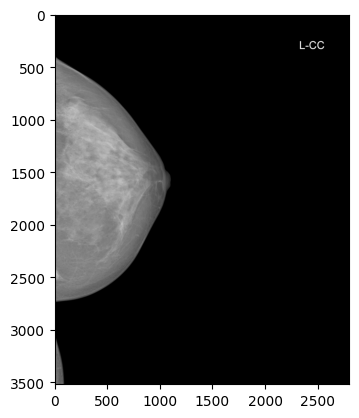

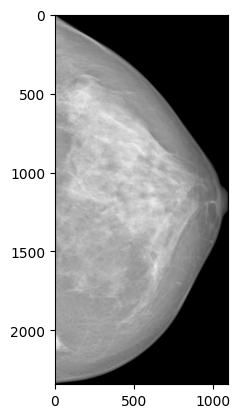

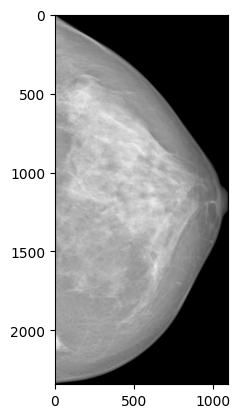

1/1 [==============================] - 0s 42ms/step


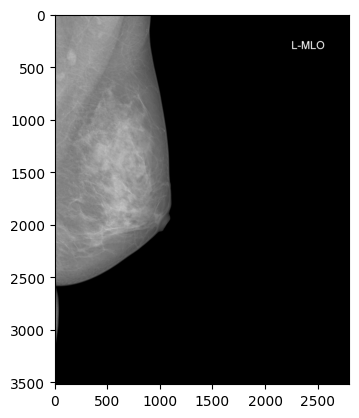

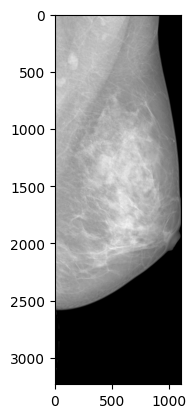

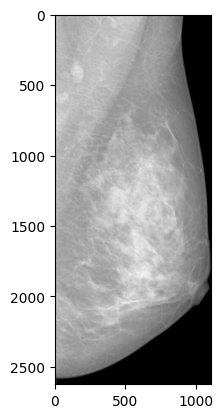

1/1 [==============================] - 0s 42ms/step


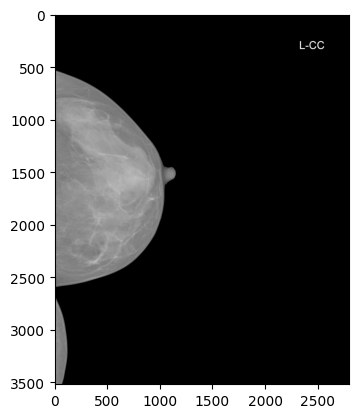

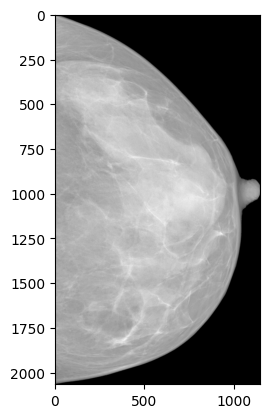

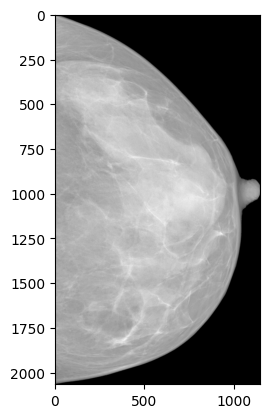

1/1 [==============================] - 0s 43ms/step


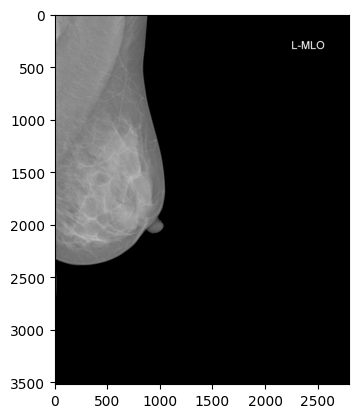

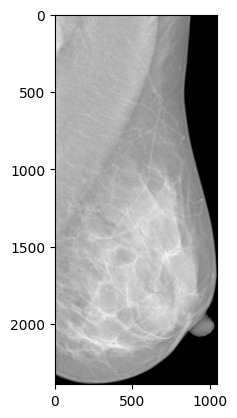

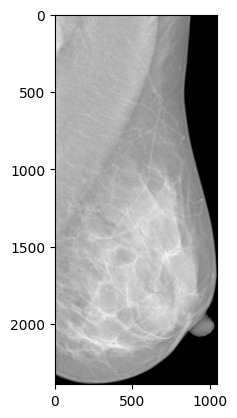

1/1 [==============================] - 0s 38ms/step


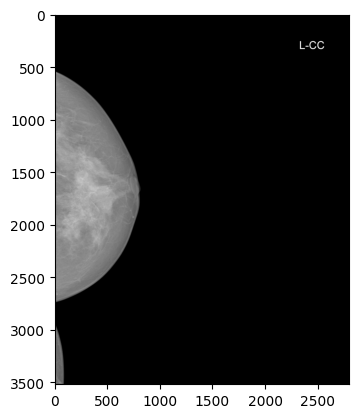

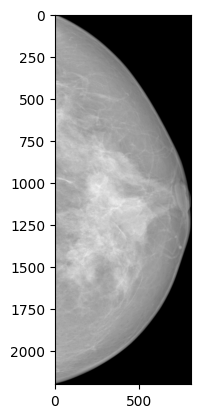

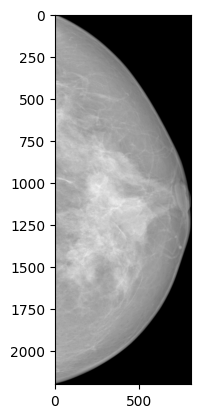

1/1 [==============================] - 0s 36ms/step


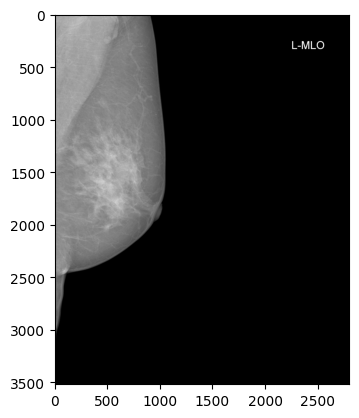

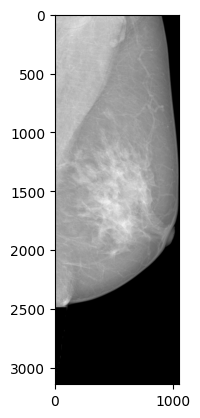

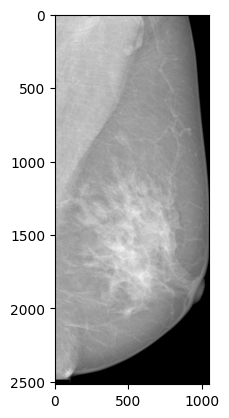

1/1 [==============================] - 0s 40ms/step


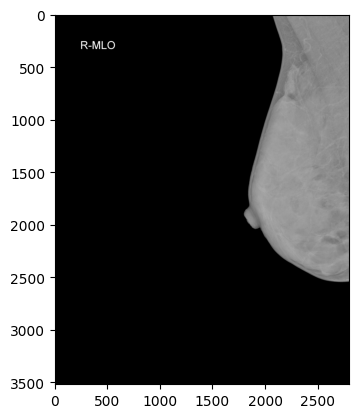

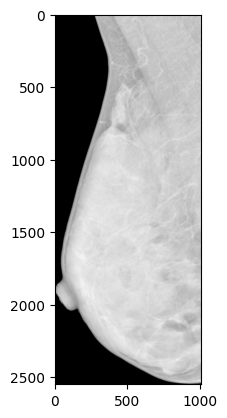

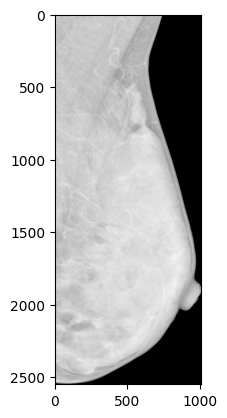

1/1 [==============================] - 0s 39ms/step


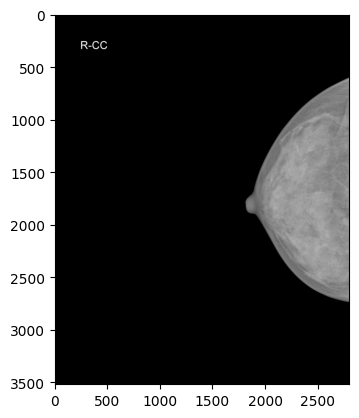

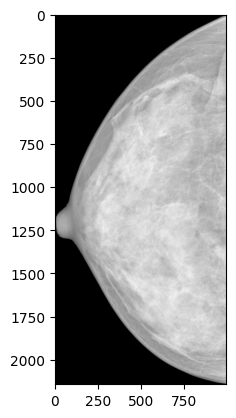

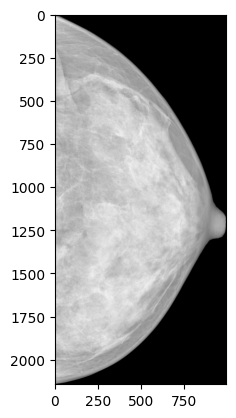

1/1 [==============================] - 0s 41ms/step


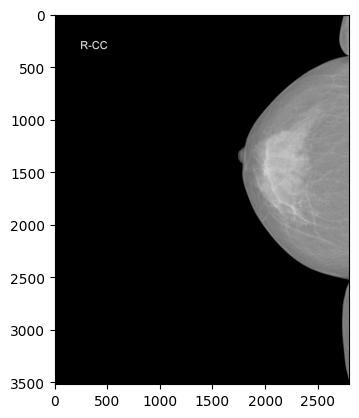

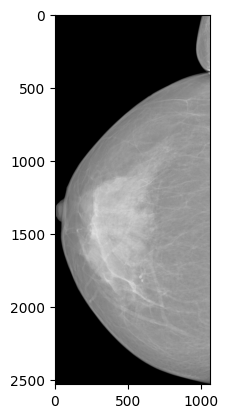

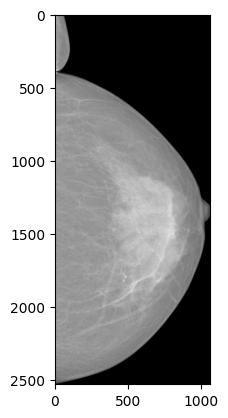

1/1 [==============================] - 0s 44ms/step


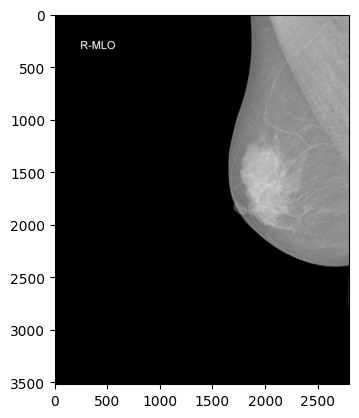

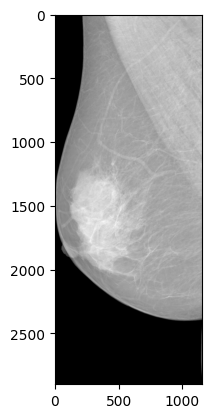

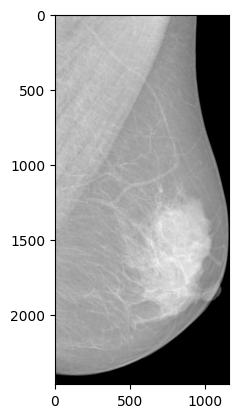

1/1 [==============================] - 0s 41ms/step


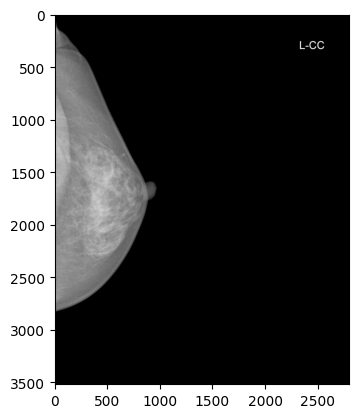

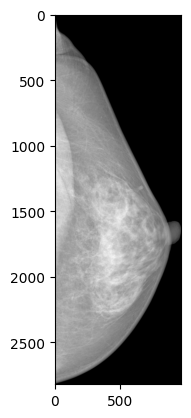

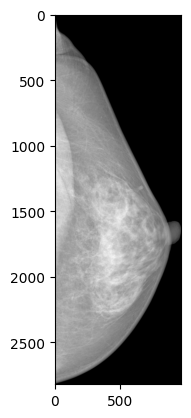

1/1 [==============================] - 0s 40ms/step


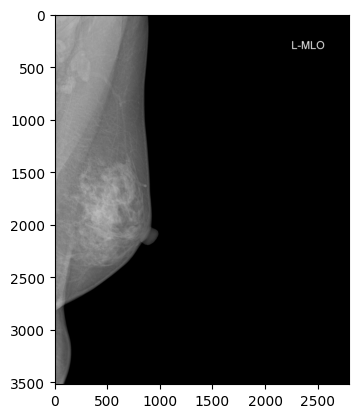

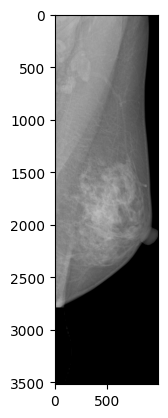

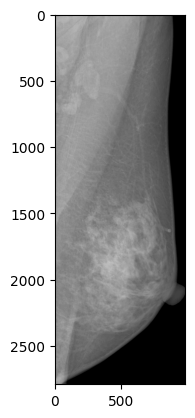

1/1 [==============================] - 0s 39ms/step


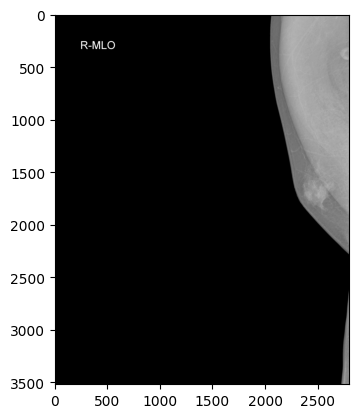

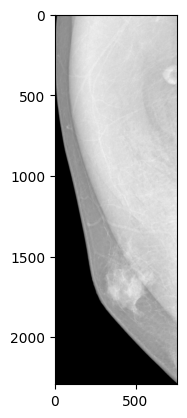

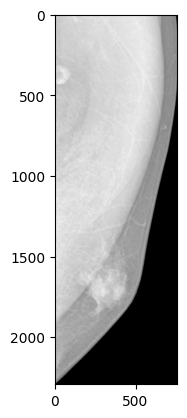

1/1 [==============================] - 0s 41ms/step


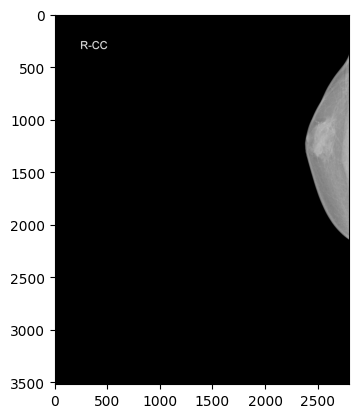

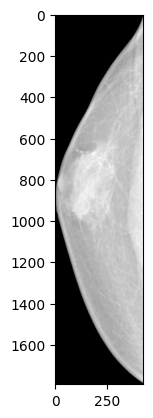

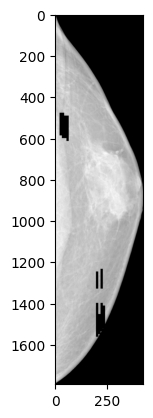

1/1 [==============================] - 0s 51ms/step


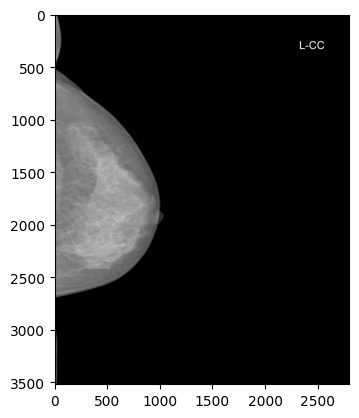

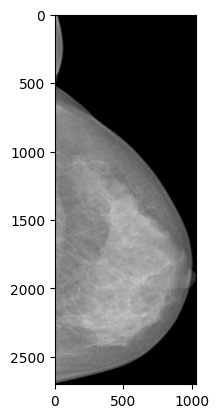

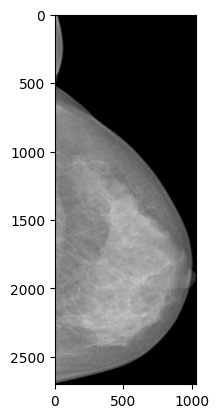

1/1 [==============================] - 0s 45ms/step


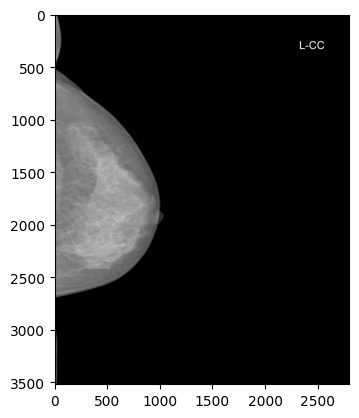

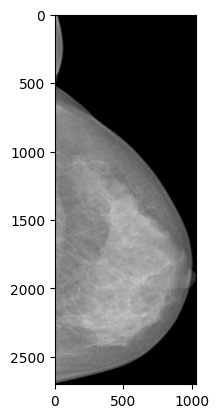

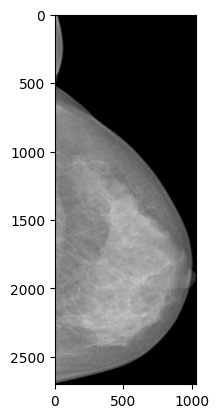

1/1 [==============================] - 0s 33ms/step


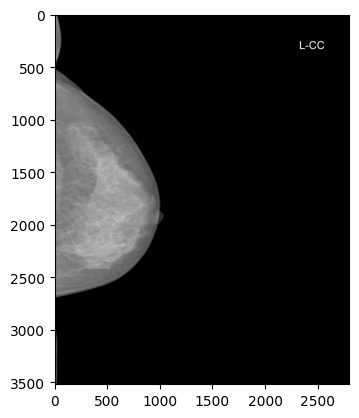

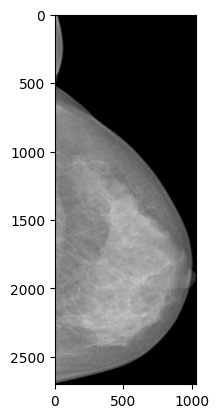

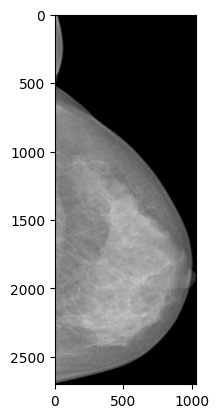

1/1 [==============================] - 0s 37ms/step


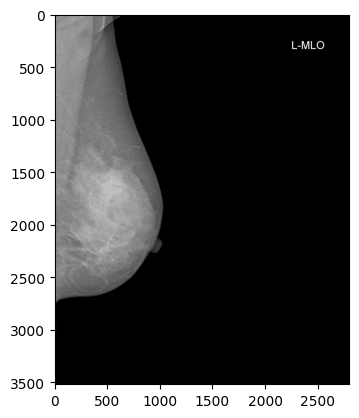

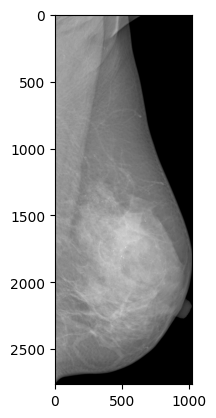

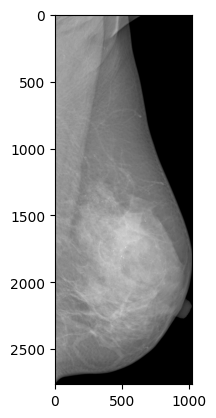

1/1 [==============================] - 0s 40ms/step


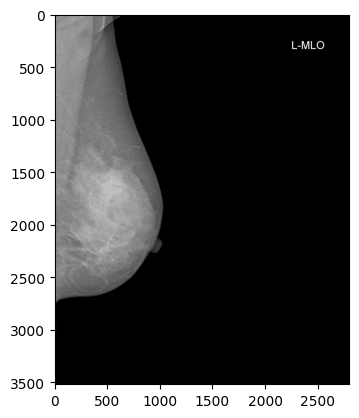

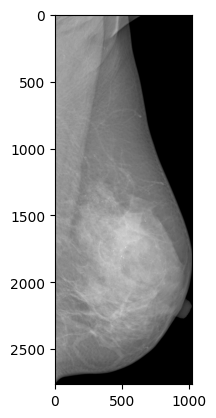

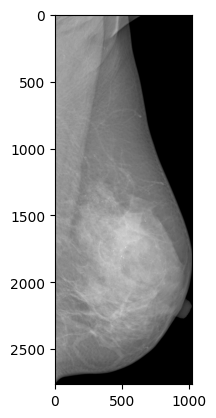

1/1 [==============================] - 0s 32ms/step


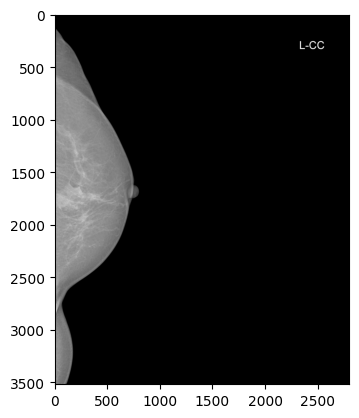

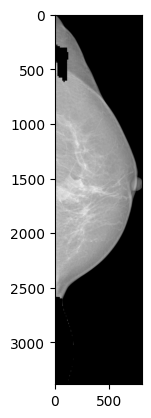

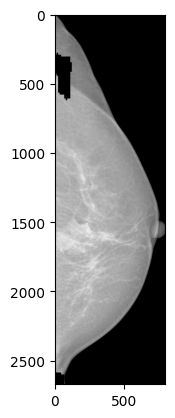

1/1 [==============================] - 0s 46ms/step


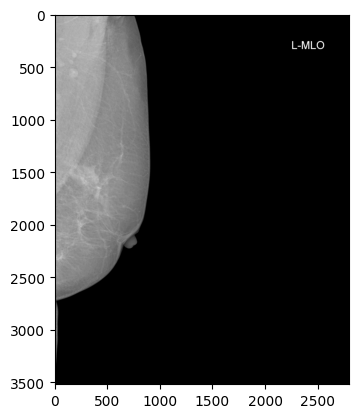

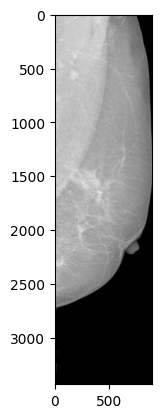

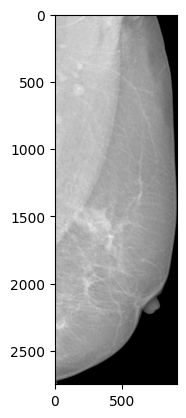

1/1 [==============================] - 0s 28ms/step


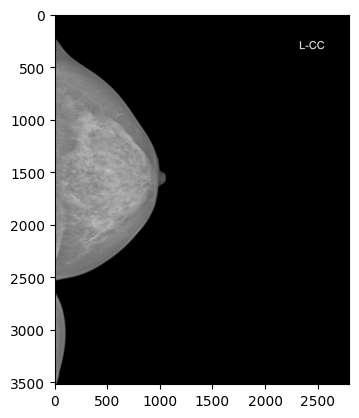

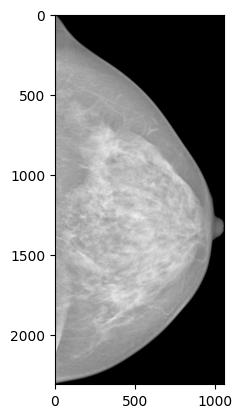

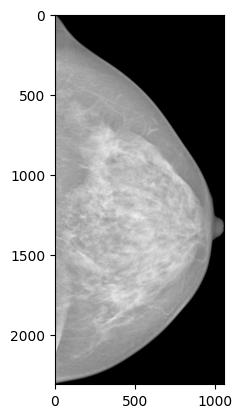

1/1 [==============================] - 0s 37ms/step


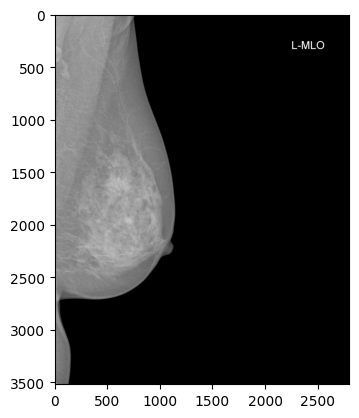

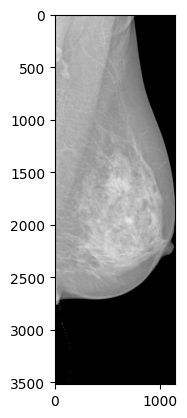

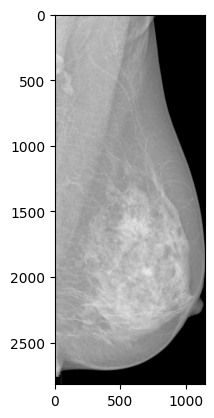

1/1 [==============================] - 0s 32ms/step


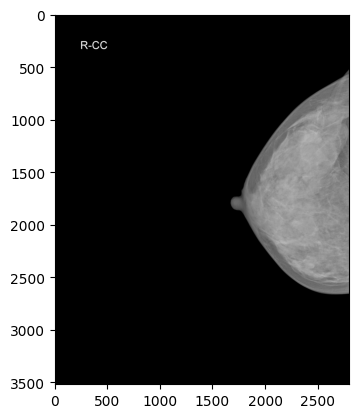

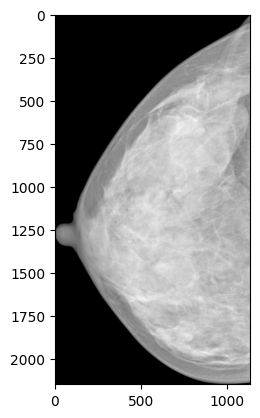

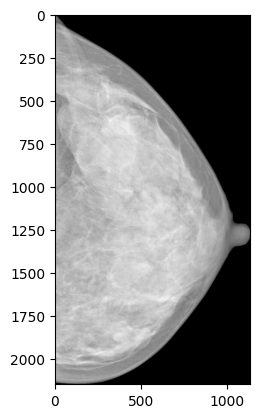

1/1 [==============================] - 0s 31ms/step


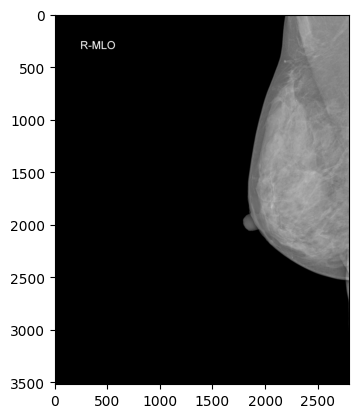

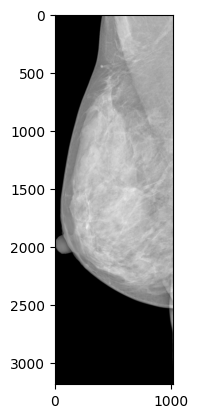

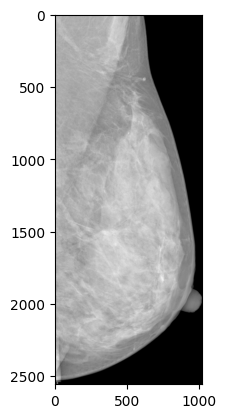

1/1 [==============================] - 0s 37ms/step


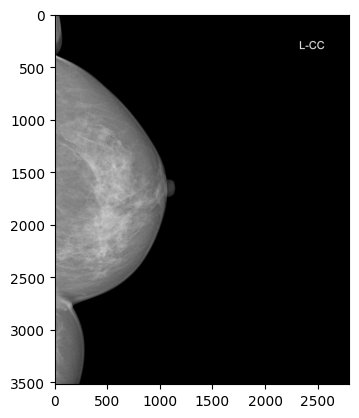

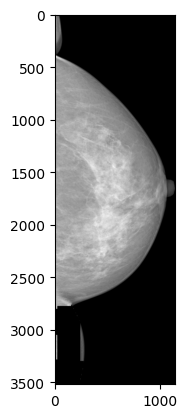

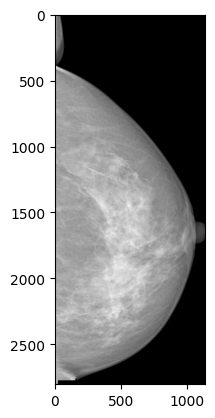

1/1 [==============================] - 0s 39ms/step


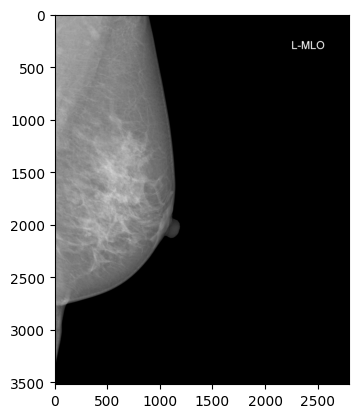

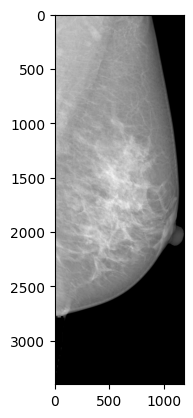

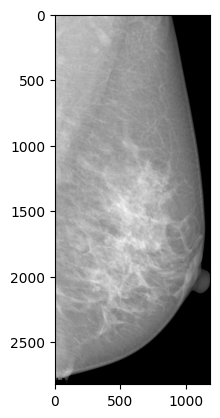

1/1 [==============================] - 0s 40ms/step


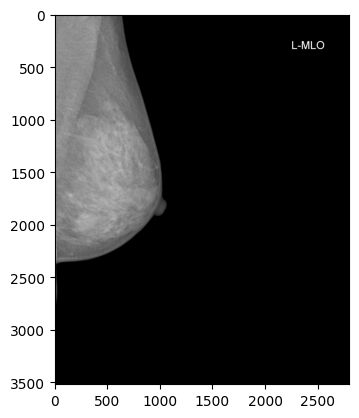

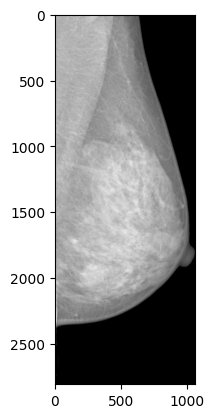

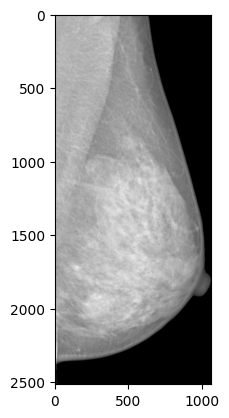

1/1 [==============================] - 0s 45ms/step


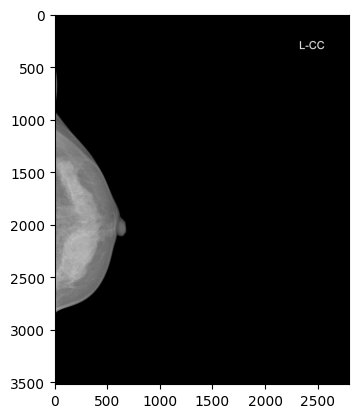

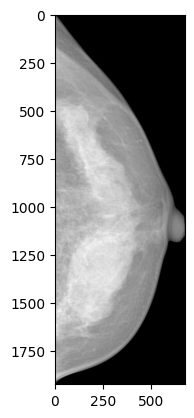

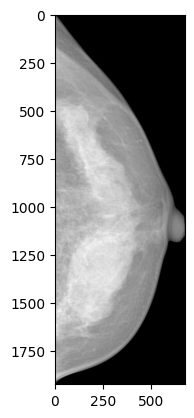

1/1 [==============================] - 0s 32ms/step


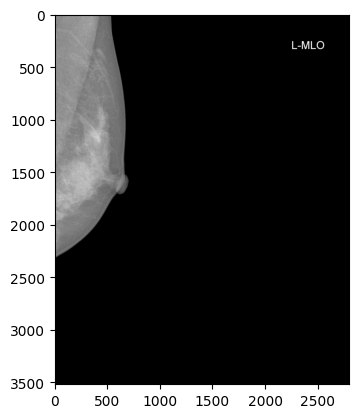

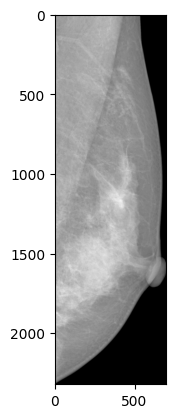

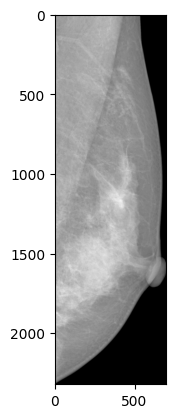

1/1 [==============================] - 0s 41ms/step


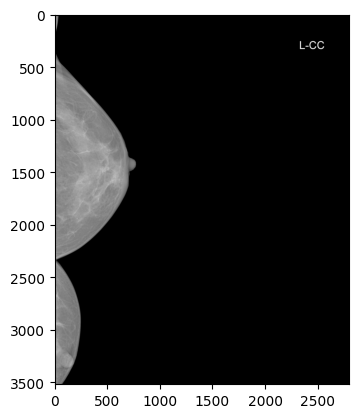

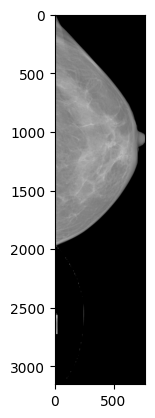

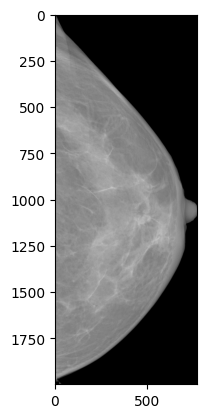

1/1 [==============================] - 0s 43ms/step


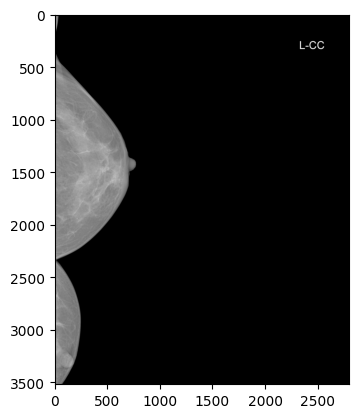

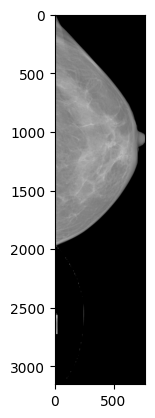

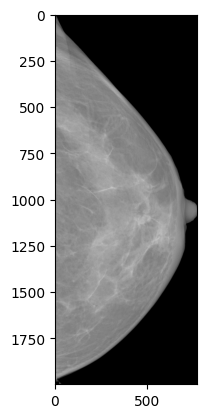

1/1 [==============================] - 0s 38ms/step


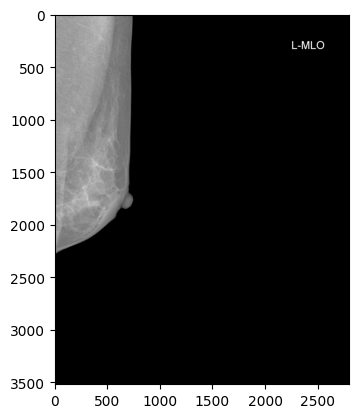

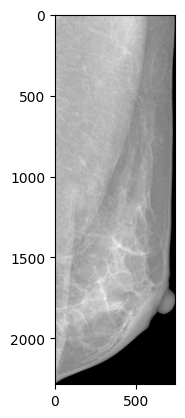

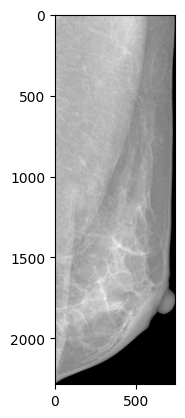

1/1 [==============================] - 0s 39ms/step


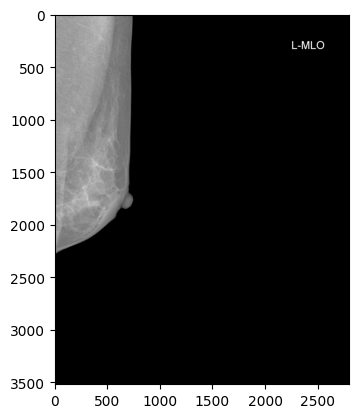

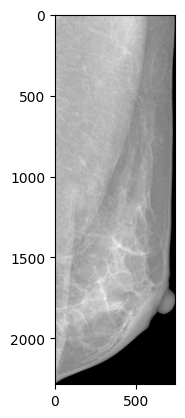

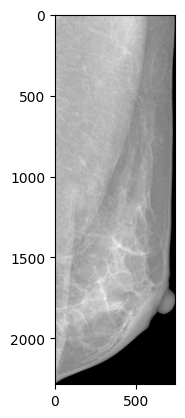

1/1 [==============================] - 0s 39ms/step


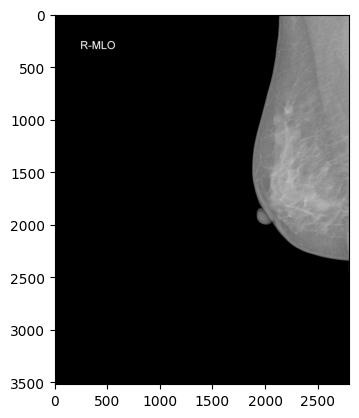

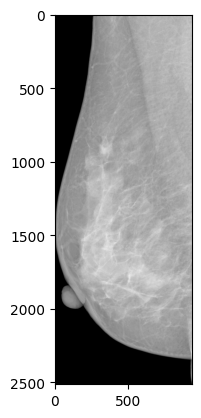

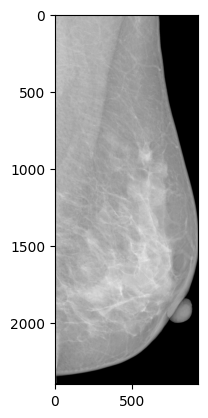

1/1 [==============================] - 0s 39ms/step


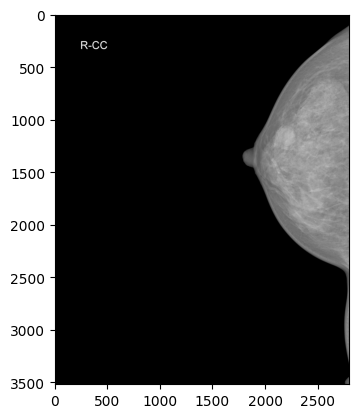

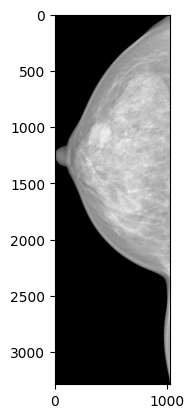

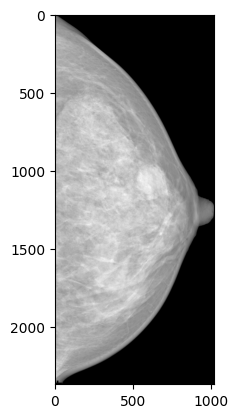

1/1 [==============================] - 0s 40ms/step


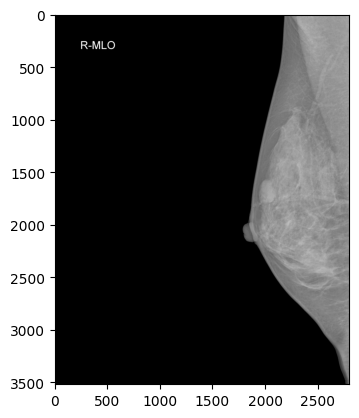

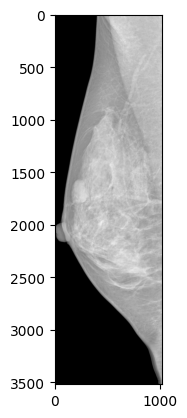

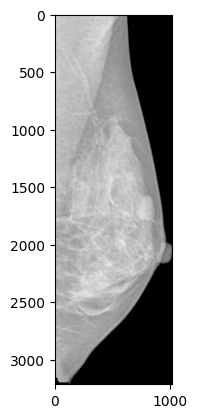

1/1 [==============================] - 0s 46ms/step


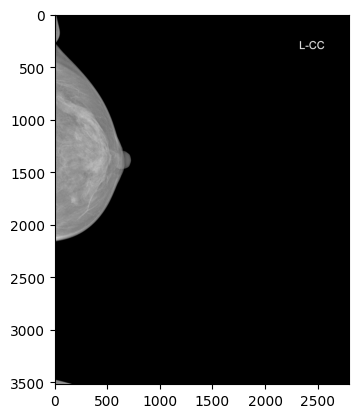

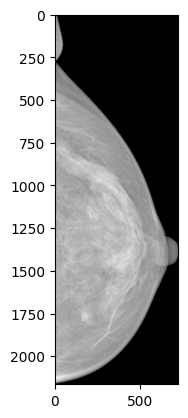

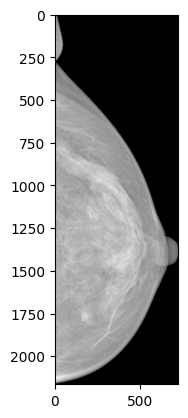

1/1 [==============================] - 0s 43ms/step


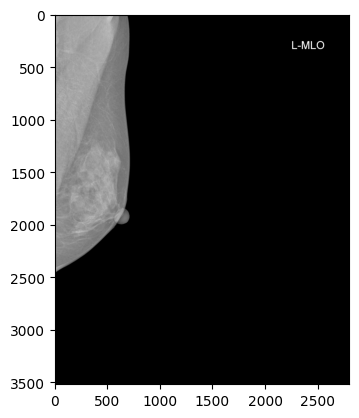

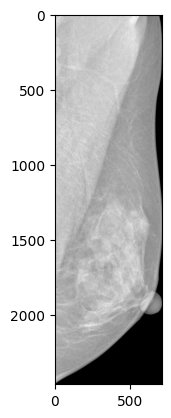

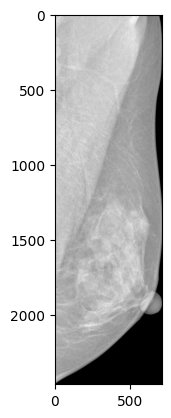

1/1 [==============================] - 0s 43ms/step


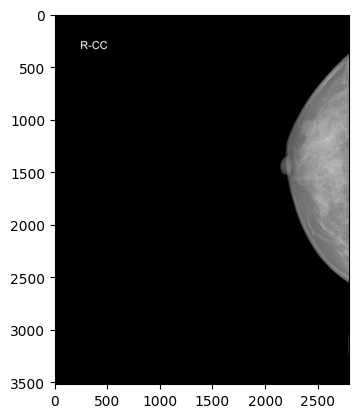

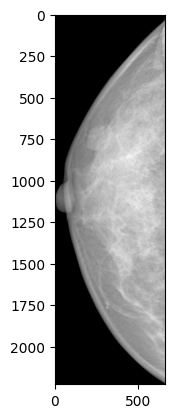

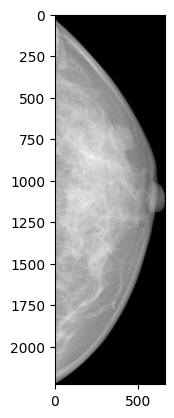

1/1 [==============================] - 0s 46ms/step


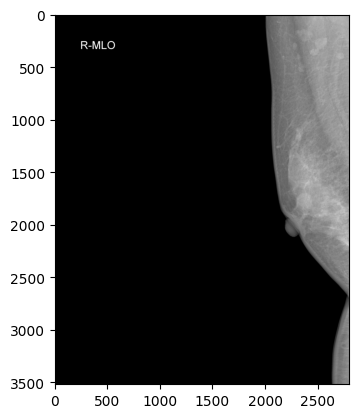

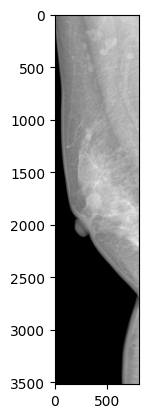

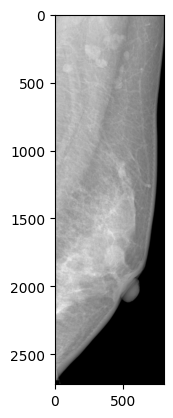

1/1 [==============================] - 0s 31ms/step


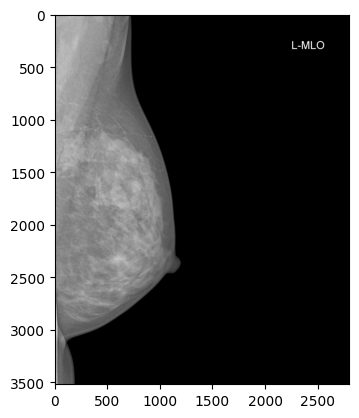

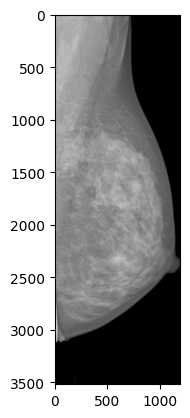

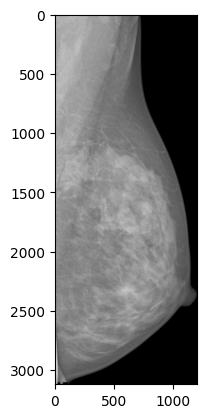

1/1 [==============================] - 0s 34ms/step


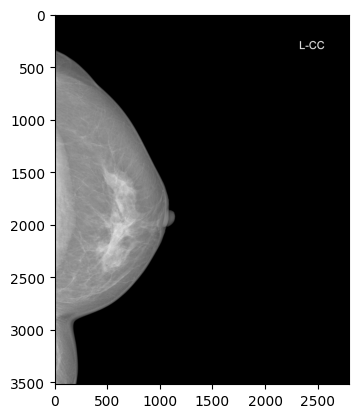

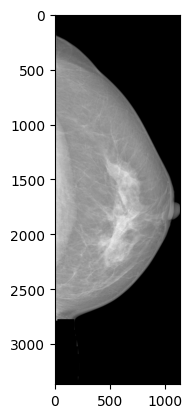

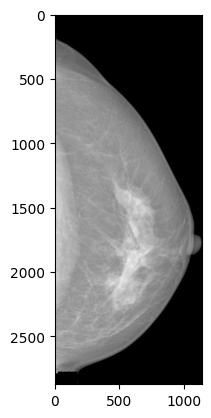

1/1 [==============================] - 0s 40ms/step


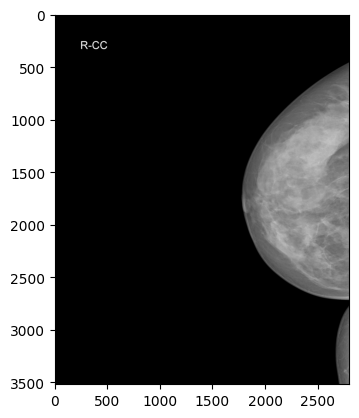

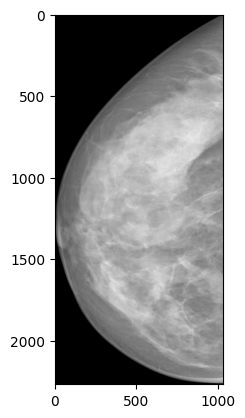

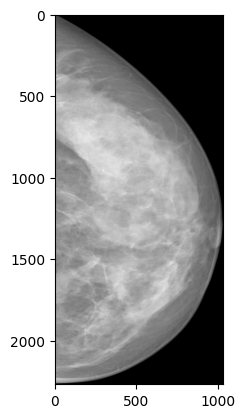

1/1 [==============================] - 0s 44ms/step


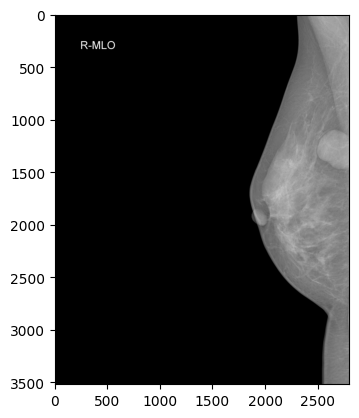

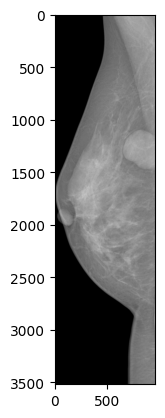

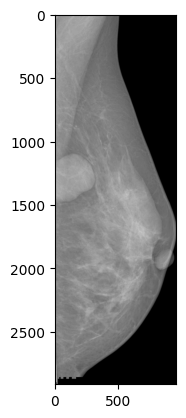

1/1 [==============================] - 0s 39ms/step


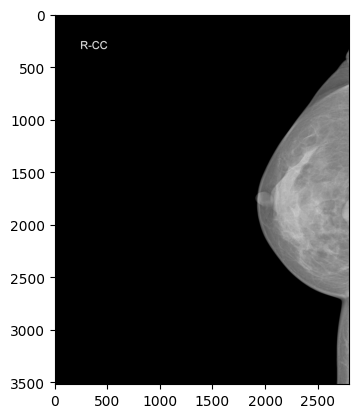

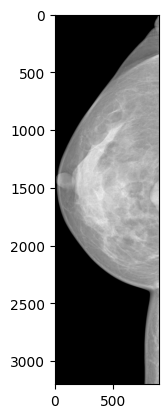

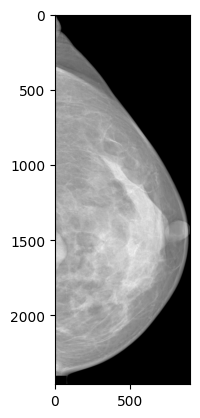

1/1 [==============================] - 0s 37ms/step


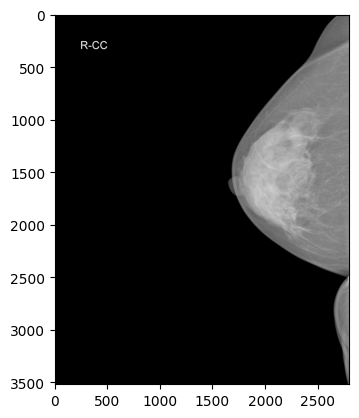

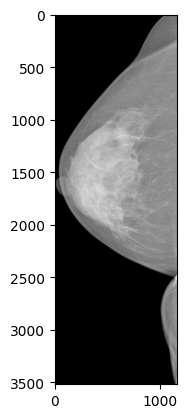

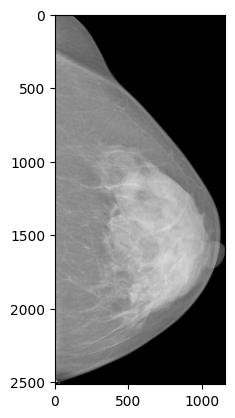

1/1 [==============================] - 0s 36ms/step


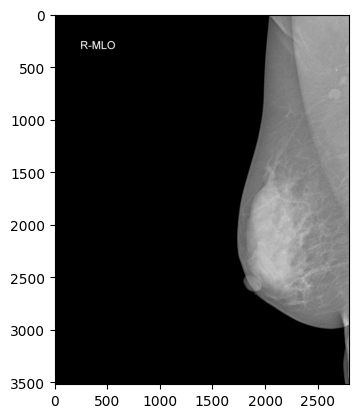

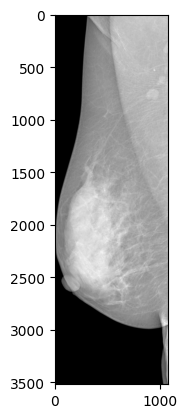

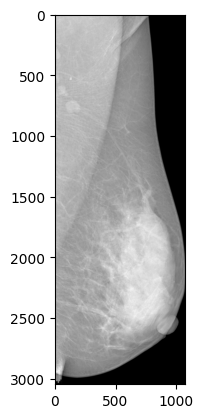

1/1 [==============================] - 0s 48ms/step


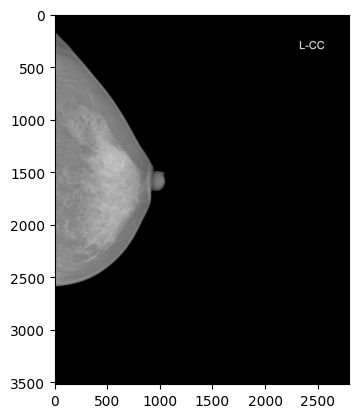

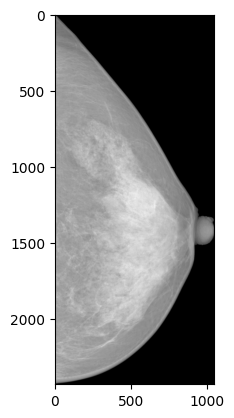

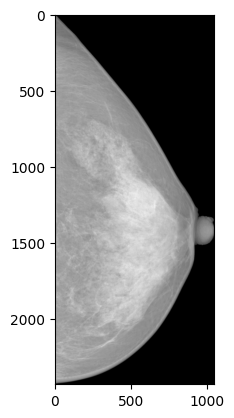

1/1 [==============================] - 0s 46ms/step


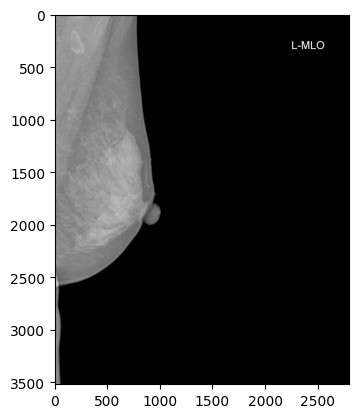

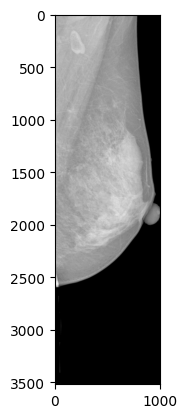

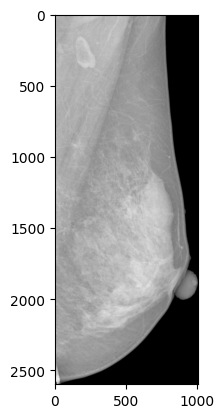

1/1 [==============================] - 0s 51ms/step


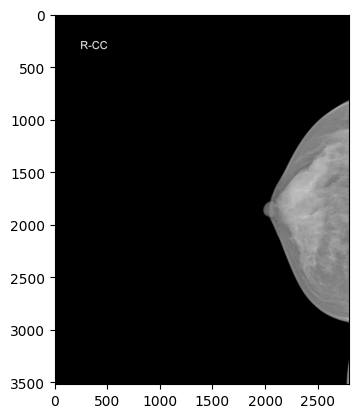

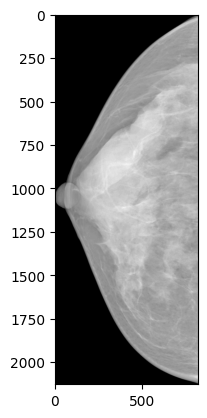

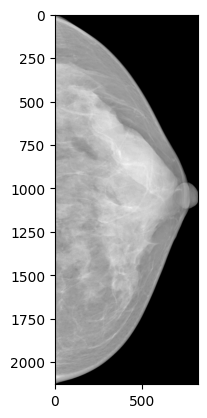

1/1 [==============================] - 0s 43ms/step


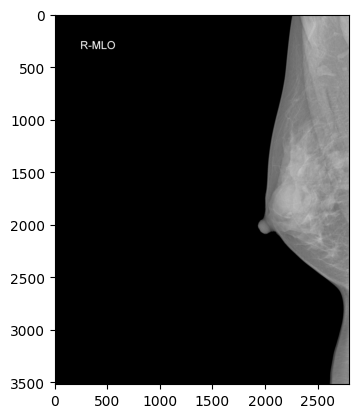

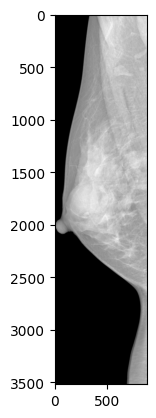

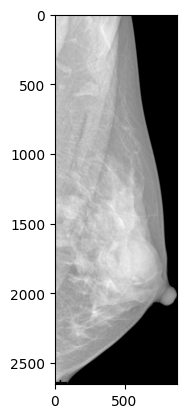

1/1 [==============================] - 0s 41ms/step


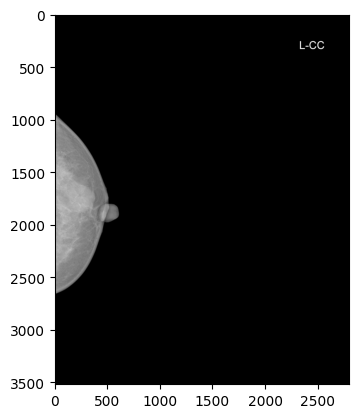

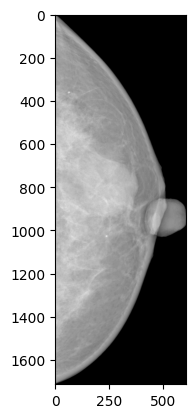

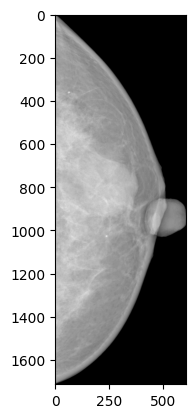

1/1 [==============================] - 0s 33ms/step


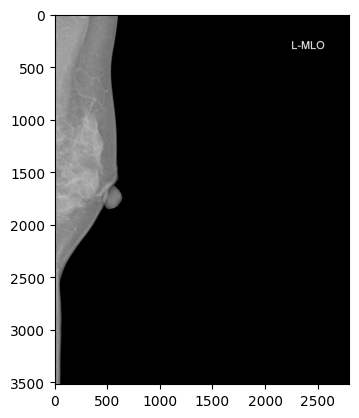

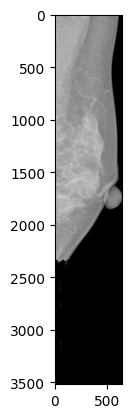

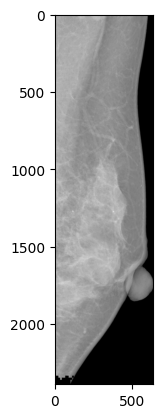

1/1 [==============================] - 0s 41ms/step


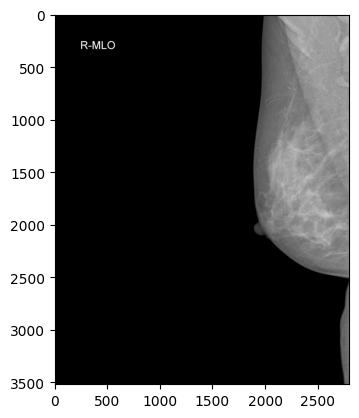

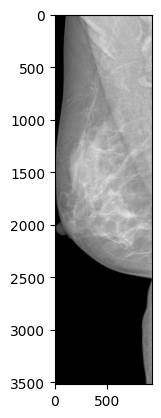

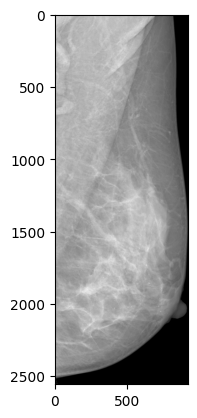

1/1 [==============================] - 0s 40ms/step


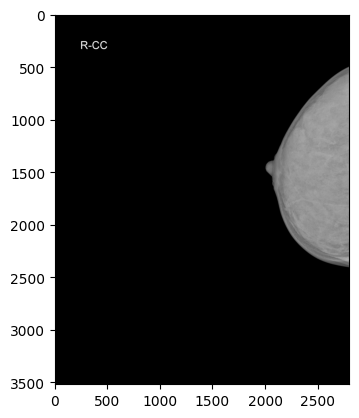

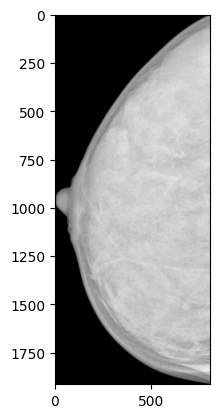

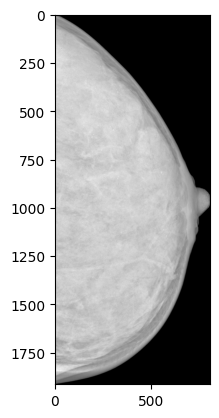

1/1 [==============================] - 0s 32ms/step


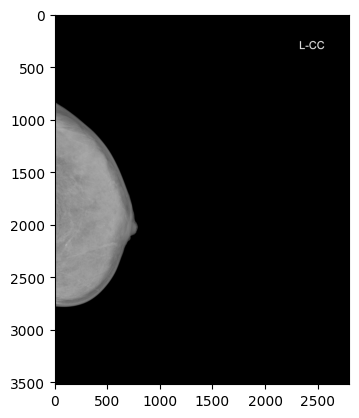

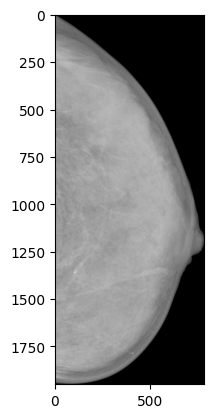

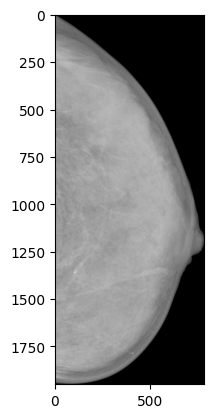

1/1 [==============================] - 0s 37ms/step


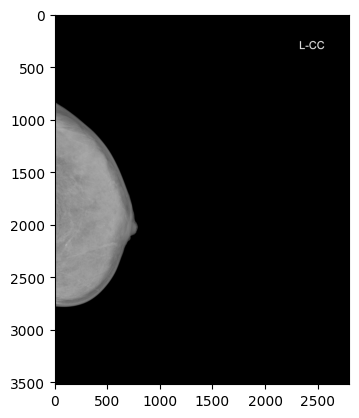

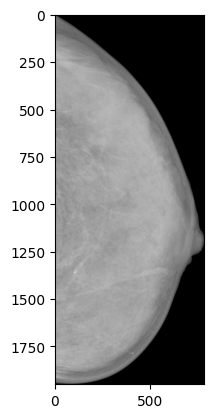

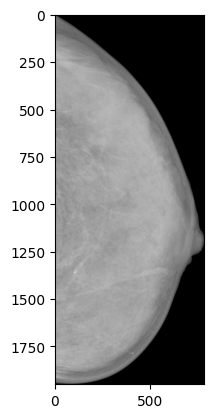

1/1 [==============================] - 0s 41ms/step


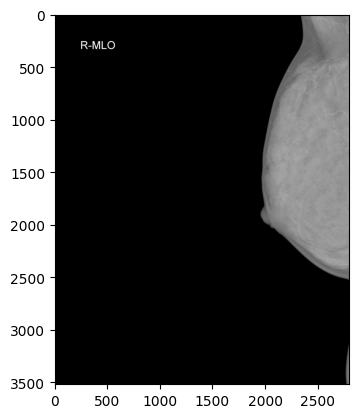

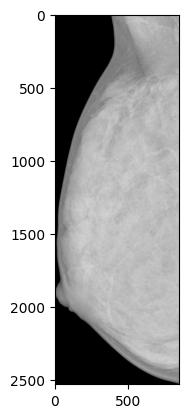

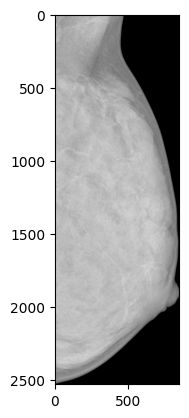

1/1 [==============================] - 0s 40ms/step


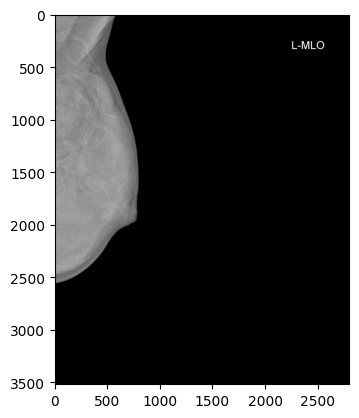

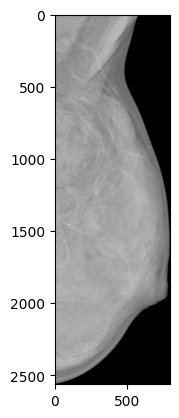

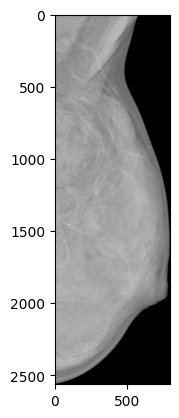

1/1 [==============================] - 0s 25ms/step


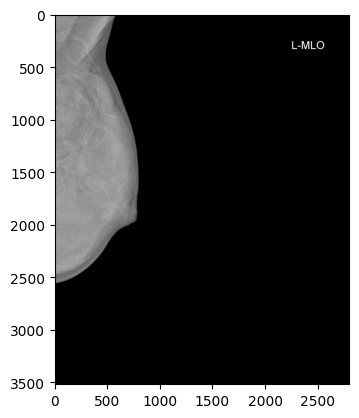

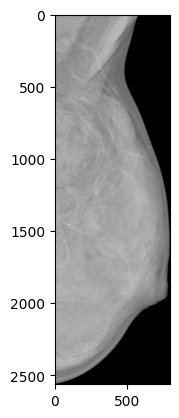

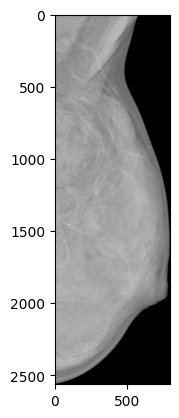

1/1 [==============================] - 0s 33ms/step


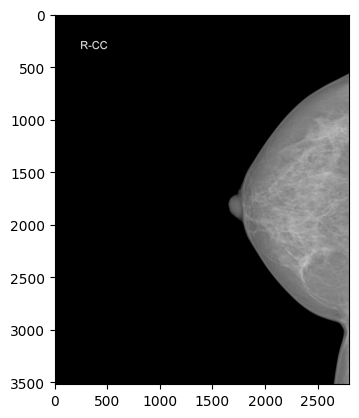

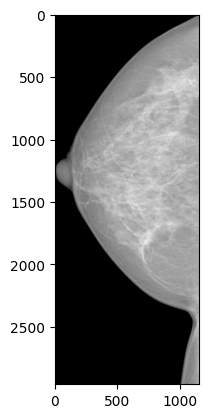

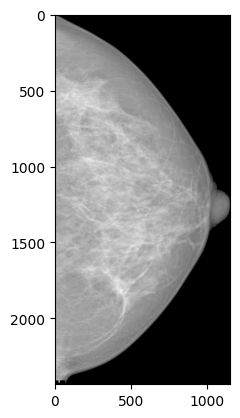

1/1 [==============================] - 0s 40ms/step


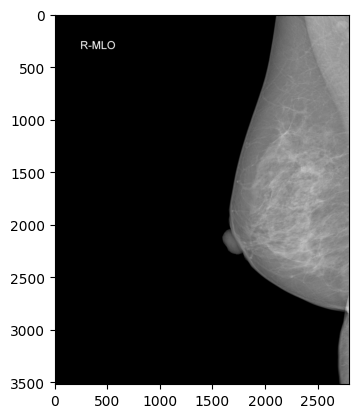

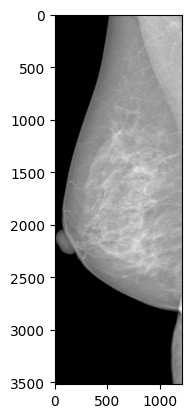

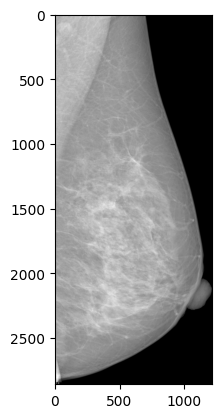

1/1 [==============================] - 0s 37ms/step


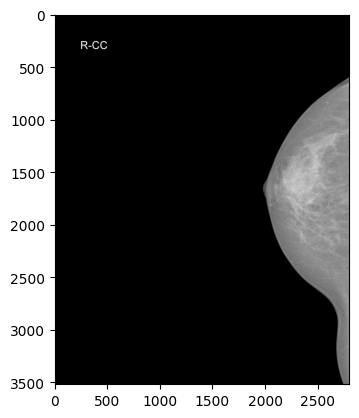

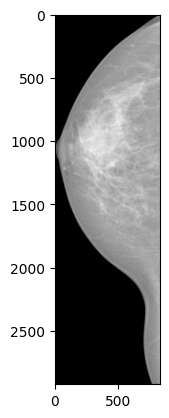

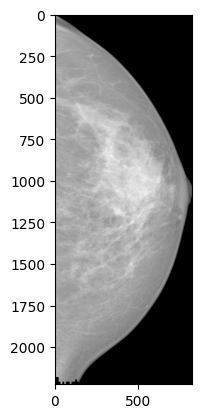

1/1 [==============================] - 0s 41ms/step


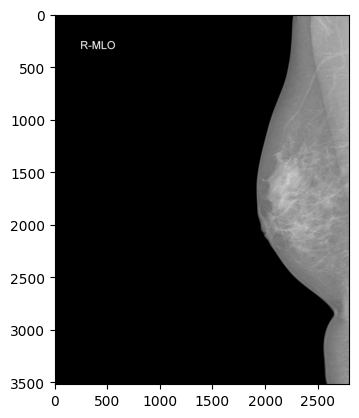

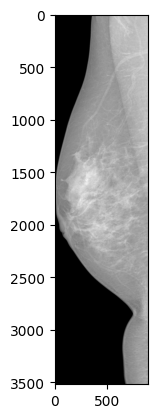

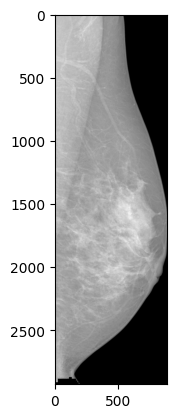

1/1 [==============================] - 0s 35ms/step


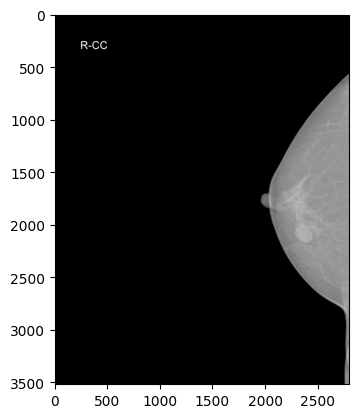

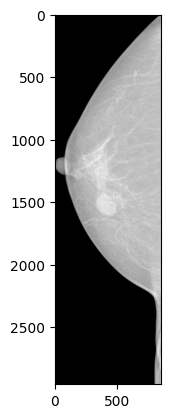

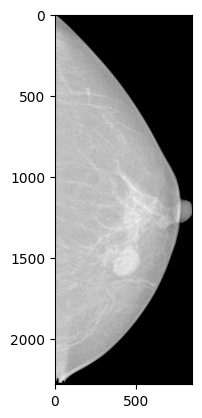

1/1 [==============================] - 0s 40ms/step


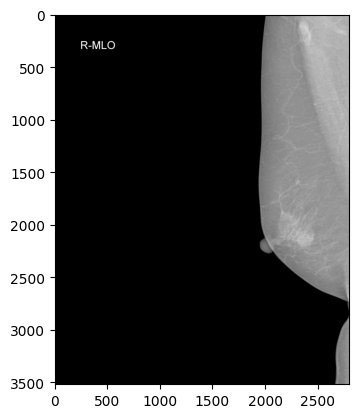

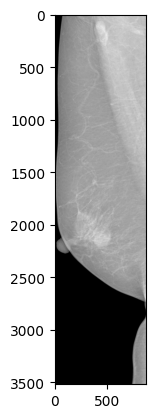

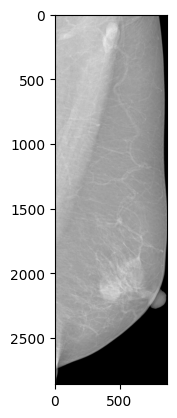

1/1 [==============================] - 0s 48ms/step


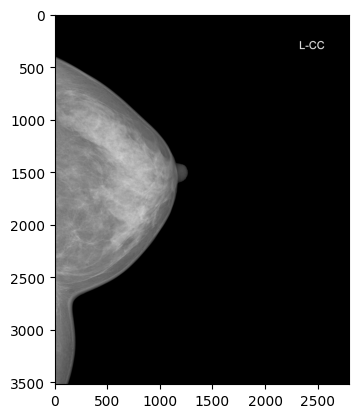

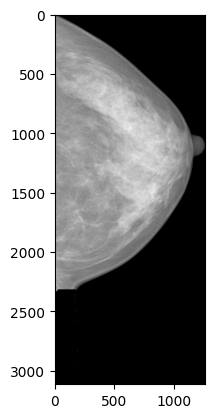

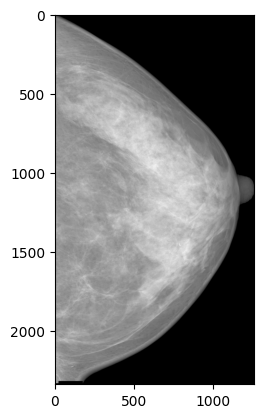

1/1 [==============================] - 0s 42ms/step


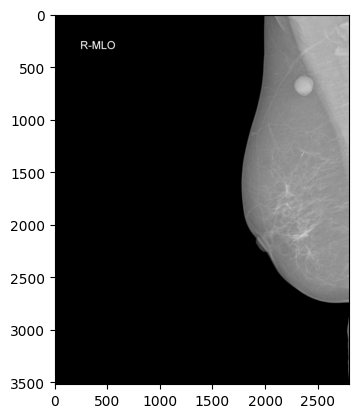

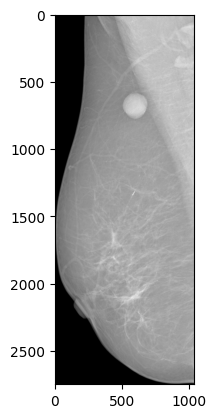

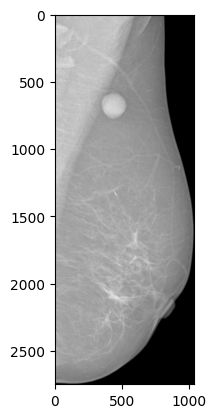

1/1 [==============================] - 0s 41ms/step


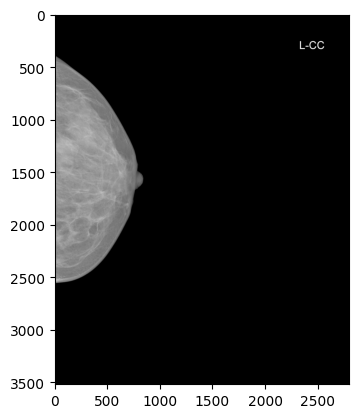

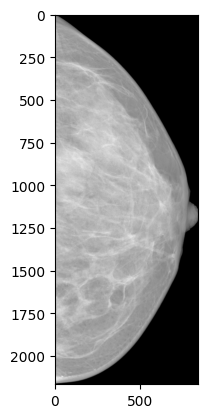

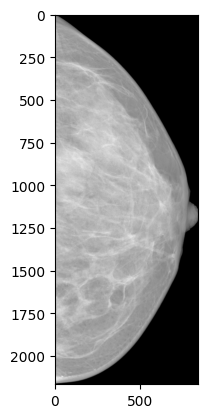

1/1 [==============================] - 0s 44ms/step


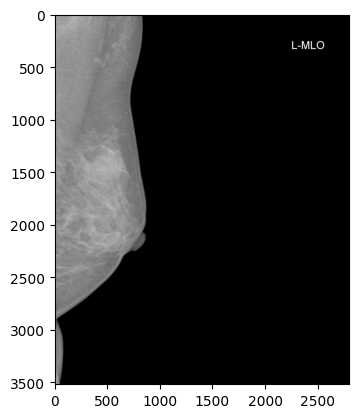

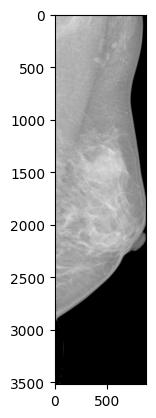

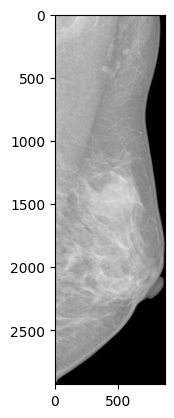

1/1 [==============================] - 0s 34ms/step


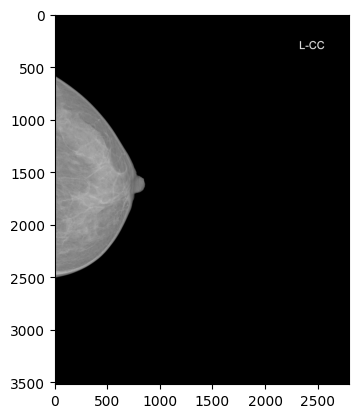

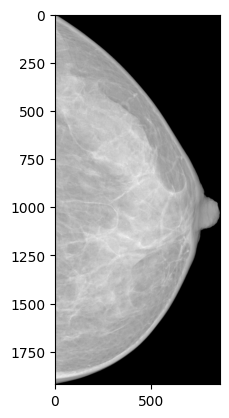

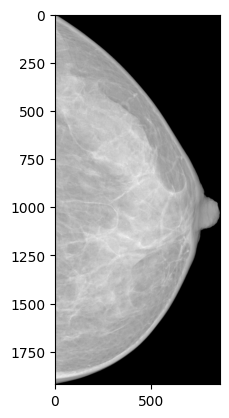

1/1 [==============================] - 0s 41ms/step


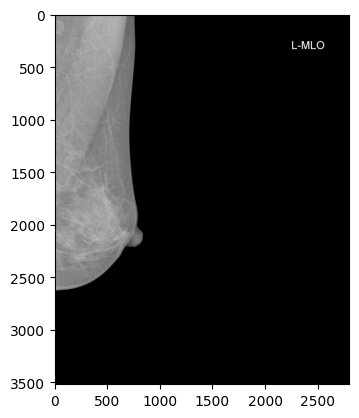

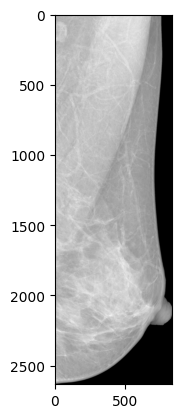

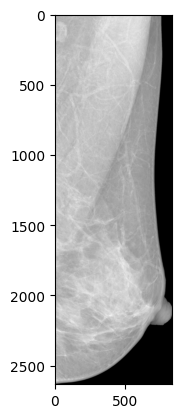

1/1 [==============================] - 0s 39ms/step


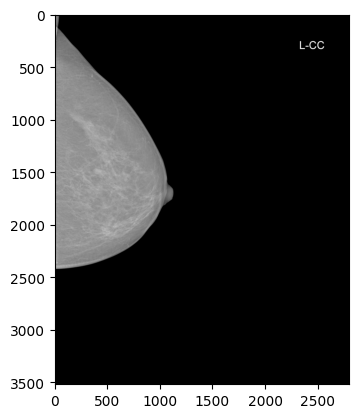

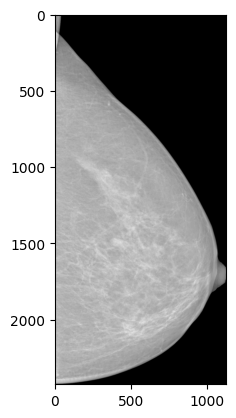

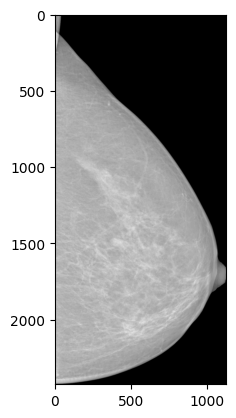

1/1 [==============================] - 0s 48ms/step


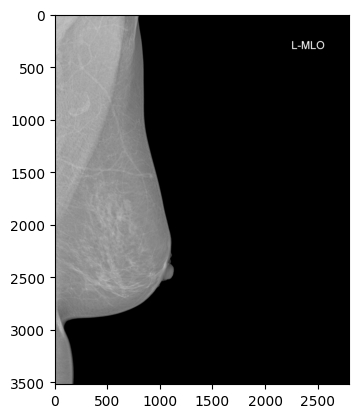

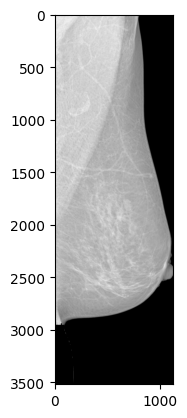

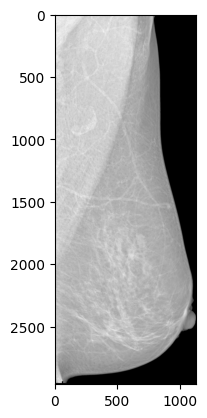

1/1 [==============================] - 0s 37ms/step


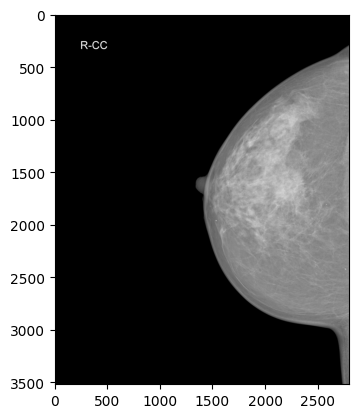

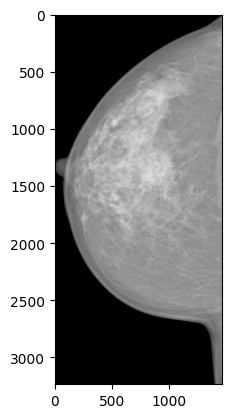

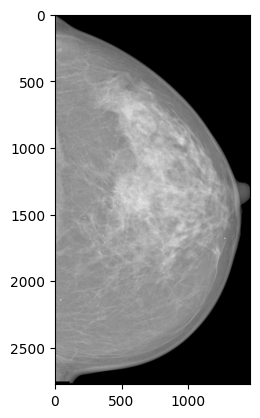

1/1 [==============================] - 0s 38ms/step


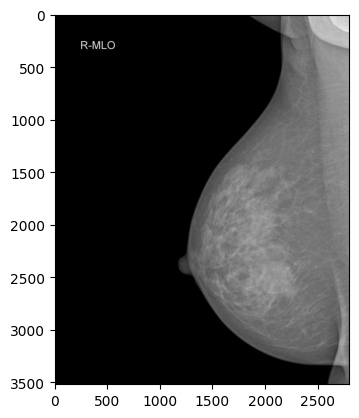

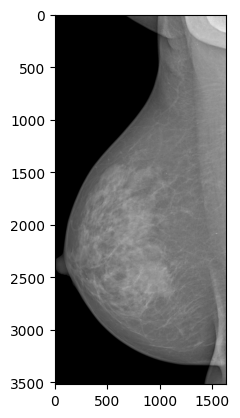

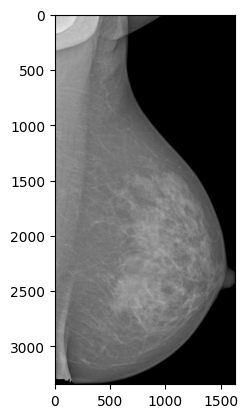

1/1 [==============================] - 0s 41ms/step


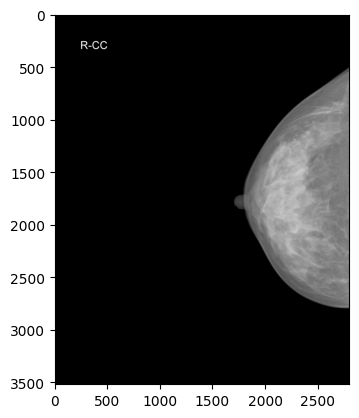

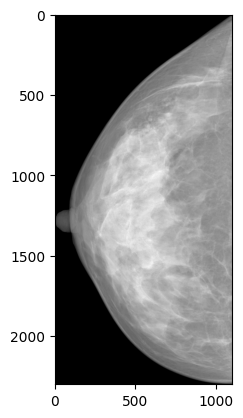

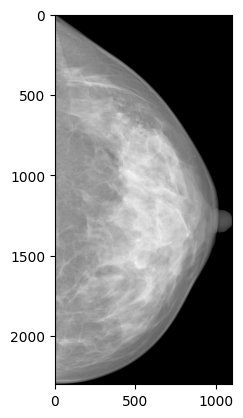

1/1 [==============================] - 0s 39ms/step


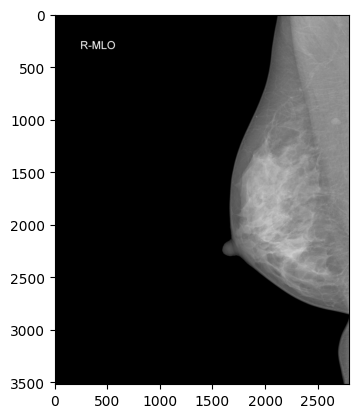

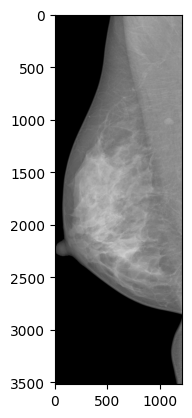

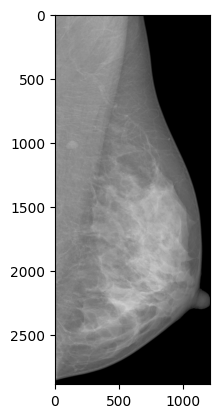

In [11]:
import os
from matplotlib import pyplot as plt
import pydicom

# Directory containing DICOM images
dicom_directory = 'E:/PhD/V_M_Dataset/images/'
report_1 = []
report_2 = []


# Iterate through each image in the dataframe
for i, row in finding_annotations.iloc[:100].iterrows():
    if "['No Finding']" == finding_annotations['finding_categories'][i]:
        print("['No Finding in this image']")
    else:
        # Construct the path to the DICOM image
        dicom_image_path = os.path.join(dicom_directory, row[0], row[2] + '.dicom')
        
        # Read the DICOM file
        dicom_data = pydicom.dcmread(dicom_image_path)
        dicom_pixels = dicom_data.pixel_array

        # Normalize the pixel values between 0 and 255
        normalized_pixels = ((dicom_pixels - np.min(dicom_pixels)) / 
                             (np.max(dicom_pixels) - np.min(dicom_pixels)) * 255).astype(np.uint8)


        # Apply custom preprocessing to clean the image
        clean_image_from_text = delete_text_writen_in_image(normalized_pixels, window_size=(700, 700))
        image_first_crop = crop_to_roi(clean_image_from_text, return_mask=False)

        if finding_annotations['laterality'][i].upper() == "R":
            clean_image_from_text = cv2.flip(clean_image_from_text, 1) 

 
            
        clean_4 = elemination_of_errors_in_mammo(clean_image_from_text)
        image_second_crop = crop_to_roi(clean_4, return_mask=False)
        
        h_big, w_big = normalized_pixels.shape
        h_small_1, w_small_1 = image_first_crop.shape
        h_small_2, w_small_2 = image_second_crop.shape
        
        pixels_big = h_big * w_big
        pixels_small_1 = h_small_1 * w_small_1
        pixels_small_2 = h_small_2 * w_small_2
        
        # Përqindja që zë ROI në imazhin e madh
        percentage_1 = (pixels_small_1 / pixels_big) * 100
        percentage_2 = (pixels_small_2 / pixels_big) * 100
        
        report_1.append(percentage_1)
        report_2.append(percentage_2)
        #printimi nese ka funksionuar crop
        
        plt.imshow(normalized_pixels, 'gray')
        plt.show()
        plt.imshow(image_first_crop, 'gray')
        plt.show()
        plt.imshow(image_second_crop, 'gray')
        plt.show()
        
        
  

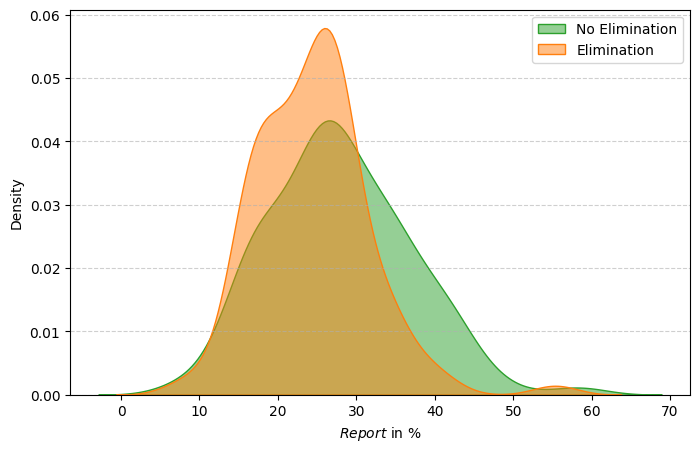

In [12]:
import seaborn as sns
plt.figure(figsize=(8,5))

# Plot distributions
sns.kdeplot(report_1, fill=True, color="#2ca02c", label="No Elimination", alpha=0.5)
sns.kdeplot(report_2, fill=True, color="#ff7f0e", label="Elimination", alpha=0.5)

plt.xlabel(r'$Report$ in %')
plt.ylabel("Density")
plt.grid(axis='y', linestyle="--", alpha=0.6)
plt.legend()
plt.show()


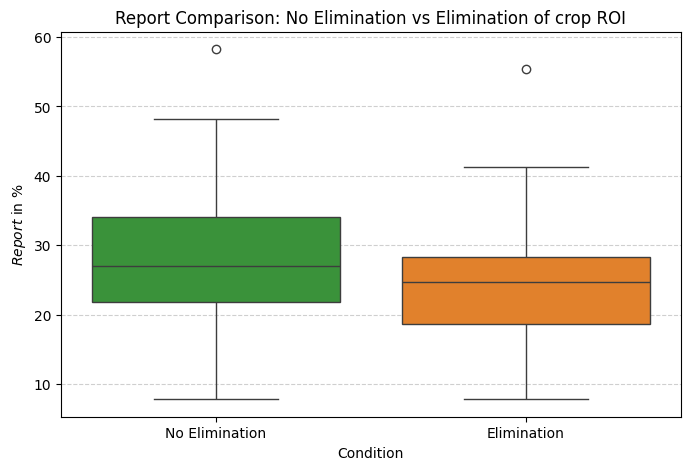

In [13]:
plt.figure(figsize=(8,5))

# Boxplot for report_1 and report_2
sns.boxplot(data=[report_1, report_2], 
            palette=["#2ca02c", "#ff7f0e"])

plt.xticks([0, 1], ["No Elimination", "Elimination"])
plt.xlabel("Condition")
plt.ylabel(r'$Report$ in %')
plt.grid(axis='y', linestyle="--", alpha=0.6)
plt.title("Report Comparison: No Elimination vs Elimination of crop ROI")
plt.show()


In [14]:
import numpy as np

mean_report1 = np.mean(report_1)
mean_report2 = np.mean(report_2)

diff_means = mean_report2 - mean_report1

print(f"Mesatarja e No Elimination: {mean_report1:.3f}")
print(f"Mesatarja e Elimination: {mean_report2:.3f}")
print(f"Diferenca e mesatareve (Elimination - No Elimination): {diff_means:.3f}")


Mesatarja e No Elimination: 27.885
Mesatarja e Elimination: 24.353
Diferenca e mesatareve (Elimination - No Elimination): -3.532
